# Cross-View Image Retrieval (CVIR)

In this part, we'll be implementing a Cross-View Image Retrieval System. You have probably heard about Content Based Image Retrieval Systems (CBIR) where we have a database of images and given a query image, we will return similar images based on their features (Basically, Google Image Search). CVIR is a more complex problem, where your query image will have a different *view* and you will search for similar images in a different view which contain the same semantic information. For instance, you may have a satellite image of a river, and when you pass this in a CVIR, it should return images of rivers taken from the ground-level view (or street view).

Here's an overview of the system we will be implementing in this assignment:

- **Feature Extraction**: In this component, we will train a CNN that will extract useful features of a query image. We will use transfer learning to fine-tune a VGG16 model.    
- **Similarity Matching**: This is the core of our system. Here we will find the similarity between the feature vector extracted from the query image, and the feature vectors of search images, and assign similarity scores. We will perform this for each image in the database and store their scores.     
- **Retrieval**: Once we have scores for each query image, we will sort these results based on the similarity scores, with the most similar (i.e. has the smallest distance) being on the top, and the least similar (i.e. has the largest distance) being at the bottom. Finally we will return the retrieved images.

### IMPORTANT: Enter your Roll Number in the cell below

In [0]:
ROLLNUMBER = 20100249

NUM_CLASSES = 6
labels_dict = {"freeway":0,"mountain":1,"palace":2,"river":3,"ship":4,"stadium":5}

# Batch size is a hyperparameter, feel free to change this. You may also change the number of epochs.
BATCH_SIZE = 32
EPOCHS = 25

main_dir = '/content/drive/My Drive/Colab Notebooks/DL_HW4/'

In [0]:
import keras
import tensorflow as tf
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import cv2
from keras.preprocessing.image import ImageDataGenerator
from keras.applications import VGG16
from keras.layers import Flatten, Dense, Dropout, LeakyReLU, Input, concatenate, add, Reshape, Conv2D, Activation
from keras.optimizers import Adam, RMSprop, Adagrad, SGD, Nadam
from keras.models import Model, load_model
from keras.callbacks import ModelCheckpoint, ReduceLROnPlateau, EarlyStopping, CSVLogger
from keras.utils import to_categorical, plot_model
from glob import glob
from sklearn.model_selection import train_test_split
from skimage.io import imread
from skimage.transform import resize
import collections
import os
from scipy.spatial.distance import cosine
from tensorflow.keras.preprocessing.image import ImageDataGenerator as ImageDataGenerator
from matplotlib.pyplot import figure, imshow, axis
from matplotlib.image import imread
from sklearn.metrics import confusion_matrix, plot_confusion_matrix
import seaborn as sns
from math import ceil
from IPython.display import Image

In [22]:
from google.colab import drive
drive.mount('/content/drive')
from google.colab import files

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [0]:
# !pwd
# !rsync -avzh --progress --stats '/content/drive/My Drive/Colab Notebooks/DL_HW4'
# ! unzip -o '/content/drive/My Drive/Colab Notebooks/DL_HW4/DLAS4.zip' -d '/content/drive/My Drive/Colab Notebooks/DL_HW4'

## Task 1 - Loading Data
You have been provided with Images from two different views: Street (Ground Level) and Satellite. Each of these views contain images of 6 classes: Freeway, Mountain, River, Ship, Stadium, and Palace. We know you guys loved creating Data Generators, but for this task we will be using built-in Image Generators in TensorFlow. <br> 

Additionally, we can also augment data in real-time using these generators. Data Augmentation is an important technique of generalizing your models even more for unseen data. We can augment Image data by manipulating it, which keeps all the semantic information but can essentially be treated as new data. For instance, we can rotate, flip, zoom-in an Image and this image will be treated as a new data point in addition to our current dataset.

**IMPORTANT: You may augment data, but that would mean running a lot of epochs to train your models, since we have not trained our models on augmented data**

### Using Built-In Data Generator
First, we will create ImageDataGenerator objects, which allows you to add methods to augment data in real-time as well as pre-process it. Read the documentation to get a good grip of it: [Image Pre-processing](https://keras.io/preprocessing/image/#imagedatagenerator-class)

Create an ImageDataGenerator object for training and only set the validation_split argument. (If you want to augment data and train your model for more epochs, you may add arguments for augmenting data)

In [0]:
train_aug = ImageDataGenerator(validation_split=0.2)

Now, create data generators (Train and Validation for **EACH** view) using the flow_from_directory method of the ImageDataGenerator object. Pass in the appropriate arguments.     
**IMPORTANT:**
 - Target size should be (224,224).
 - For the training generators pass in subset='training' in flow_from_directory and similarly for the validation generators, pass in subset='validation'.
 - Also pass in seed=ROLLNUMBER

In [25]:
sat_im_dir = main_dir + 'SatView/Images/'
street_im_dir = main_dir + 'StreetView/Images/'

train_sat_generator = train_aug.flow_from_directory(
    sat_im_dir,
    subset='training',
    target_size=(224,224),
    batch_size=BATCH_SIZE,
    seed=ROLLNUMBER
)
train_str_generator = train_aug.flow_from_directory(
    street_im_dir,
    subset='training',
    target_size=(224,224),
    batch_size=BATCH_SIZE,
    seed=ROLLNUMBER
)
val_sat_generator = train_aug.flow_from_directory(
    sat_im_dir,
    subset='validation',
    target_size=(224,224),
    batch_size=BATCH_SIZE,
    seed=ROLLNUMBER
)
val_str_generator = train_aug.flow_from_directory(
    street_im_dir,
    subset='validation',
    target_size=(224,224),
    batch_size=BATCH_SIZE,
    seed=ROLLNUMBER
)

Found 3360 images belonging to 6 classes.
Found 4271 images belonging to 6 classes.
Found 840 images belonging to 6 classes.
Found 1064 images belonging to 6 classes.


Feel free to explore the attributes and methods in the data generator created above. Some important ones are: filepaths (Returns a list of all files found in the specified directory), n (Number of files, this will be useful when passing in the steps_per_epoch argument in fit_generator), labels (Labels corresponding to the filepaths)

## Task 2 - Classification Models
In order to extract discriminative features, we will imply transfer learning and use VGG16 (pre-trained on ImageNet) models to fine-tune them for our purpose. These models will be used to perform image classification for images in each view. We will be training a separate model for each view.

### Create an Instance of a pre-trained VGG16 Model
We'll create an instance of a VGG16 model (pre-trained on Imagenet) that is available in the Keras Applications module. Refer to the applications module to learn more about using pre-trained models: [Keras Applications](https://keras.io/applications/).

When we create an instance of a pre-trained model, we set include_top to False, which will remove all Dense layers from the "head" of the model. We do this since we want to use the model for, say a 10-class classification task instead of ImageNet's 1000-class task. For the weights, we will pass in 'imagenet' since we want to utilize features learned from the ImageNet dataset. Lastly, we can define the input_shape that our model should expect, i.e. (224,224,3) in our case since we will be resizing images to match the input shape of VGG16.

In [0]:
base_model_sat = VGG16(weights='imagenet', include_top=False, input_shape=(224,224,3))
base_model_str = VGG16(weights='imagenet', include_top=False, input_shape=(224,224,3))





58892288/58889256 [==============================] - 2s 0us/step








In [0]:
base_model_sat.name = "sat_base_model"
base_model_str.name = "str_base_model"

### Adding additional layers to fine-tune the model
 When we want to use transfer learning to fine-tune a model trained on a problem similar to ours, we tweak the "head" of the model to meet our requirements. The models loaded above have no dense layers, so we will add a couple of dense layers and **TRAIN ONLY THOSE DENSE LAYERS** while <strong>*freezing*</strong> all other layers. We will include the following layers to our base VGG16 models:
 
 - Flatten
 - Dense layer with 1024 units and ReLu activation
 - Dropout with parameter 0.4
 - Dense layer with 1024 units and ReLu activation
 - Dropout with parameter 0.5
 - Dense layer with NUM_CLASSES and softmax activation

Using the Functional API of Keras, add the aforementioned layers to both models.     
**Note: For the Flatten layer, the input will be the output of the last layer of the base model, i.e. base_model.output.**

In [0]:
# Add layers to your Satellite Base Model
flat_sat = Flatten()(base_model_sat.output)
dense1_sat = Dense(1024, activation='relu')(flat_sat)
dropout1_sat = Dropout(rate=0.4)(dense1_sat)
dense2_sat = Dense(1024, activation='relu')(dropout1_sat)
dropout2_sat = Dropout(rate=0.5)(dense2_sat)
dense3_sat = Dense(NUM_CLASSES, activation='softmax')(dropout2_sat)

In [0]:
# Add layers to your Street Base Model
flat_str = Flatten()(base_model_str.output)
dense1_str = Dense(1024, activation='relu')(flat_str)
dropout1_str = Dropout(rate=0.4)(dense1_str)
dense2_str = Dense(1024, activation='relu')(dropout1_str)
dropout2_str = Dropout(rate=0.5)(dense2_str)
dense3_str = Dense(NUM_CLASSES, activation='softmax')(dropout2_str)

Now, create new Models using the Model constructor

In [0]:
sat_classification_model = Model(inputs=base_model_sat.input, outputs=dense3_sat)
str_classification_model = Model(inputs=base_model_str.input, outputs=dense3_str)

In [0]:
sat_classification_model.name = 'sat_classification_model'
str_classification_model.name = 'str_classification_model'

View the model summary for each model and verify if your model is correct

In [0]:
sat_classification_model.summary()

Model: "sat_classification_model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 224, 224, 3)       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56

In [0]:
str_classification_model.summary()

Model: "str_classification_model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         (None, 224, 224, 3)       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56

Before we compile our classification models, we need to *freeze* the layers of our **base_models**. If we don't do this then we will be retraining the VGG16 model and we don't want that because: 1) The filters that the pre-trained VGG16 has learned on ImageNet are most probably already very good in terms of finding features of images, so we usually don't need to re-train these layers 2) Our machines will probably die.

In order to freeze these layers, we will iterate over base_model.layers and for each layer L we will freeze it by setting L.trainable to False. Do this for both models below

In [0]:
# Freeze layers for BOTH models
for L in base_model_sat.layers:
  L.trainable = False

for L in base_model_str.layers:
  L.trainable = False

In [0]:
for L in str_classification_model.layers:
  print(L, L.trainable)

<keras.engine.input_layer.InputLayer object at 0x7f3200e8f518> False
<keras.layers.convolutional.Conv2D object at 0x7f31afcfb898> False
<keras.layers.convolutional.Conv2D object at 0x7f31afd0def0> False
<keras.layers.pooling.MaxPooling2D object at 0x7f31afca5518> False
<keras.layers.convolutional.Conv2D object at 0x7f31afcabe48> False
<keras.layers.convolutional.Conv2D object at 0x7f31afcb16a0> False
<keras.layers.pooling.MaxPooling2D object at 0x7f31afcb7400> False
<keras.layers.convolutional.Conv2D object at 0x7f31afcbfb38> False
<keras.layers.convolutional.Conv2D object at 0x7f31afcc3c88> False
<keras.layers.convolutional.Conv2D object at 0x7f31afccaa90> False
<keras.layers.pooling.MaxPooling2D object at 0x7f31afcd72e8> False
<keras.layers.convolutional.Conv2D object at 0x7f31afcdda20> False
<keras.layers.convolutional.Conv2D object at 0x7f31afc64b38> False
<keras.layers.convolutional.Conv2D object at 0x7f31afc689b0> False
<keras.layers.pooling.MaxPooling2D object at 0x7f31afc77208>

Now, we can compile our models. You already know how to do this (Hopefully)

In [0]:
# Compile
opt = Adam(lr=0.00001)

sat_classification_model.compile(loss='categorical_crossentropy', 
                                 optimizer=opt,
                                 metrics=['accuracy'])
str_classification_model.compile(loss='categorical_crossentropy', 
                                 optimizer=opt, 
                                 metrics=['accuracy'])

### Training the Classification Model
Your favourite part. Model.fit and that's about it.

Add any callbacks you want to here (I would recommend adding at least the ModelCheckpoint so you can resume training)

**Note:** For Carrying out training in intervals you can save your best models to disk and then stop your training. Whenever you wish to resume your training, you can load this model using load_model, and then call fit_generator on it. <br> In fit_generator, you will need to pass in initial_epoch as well in order to retain epoch-dependent objects such as optimizers, which will be the epoch number of the model you loaded. Secondly, you will need to set epochs relative to this initial_epoch. For instance, if your loaded model corresponds to epoch 10, and you want to train your model for 10 epochs, you will pass in initial_epoch=10 and epochs=20, not 10, since your model has already been trained for 10 epochs, and you want to train it for 10 more epochs.

In [0]:
# Callbacks for Satellite Model
if not os.path.exists(main_dir+'Models'):
    os.mkdir(main_dir+'Models/')

checkpoint_sat = ModelCheckpoint(main_dir+'Models/Sat'+'-{epoch:02d}-{val_loss:.2f}.h5', 
                             monitor='val_loss', save_best_only=True,
                             verbose=1, mode='auto')
csvlogger_sat = CSVLogger(main_dir+'Models/Sat_logs.csv', separator=',', append=False)

callbacks_sat = [checkpoint_sat, csvlogger_sat]

In [0]:
# Callbacks for Street Model
if not os.path.exists(main_dir+'Models'):
    os.mkdir(main_dir+'Models/')

checkpoint_str = ModelCheckpoint(main_dir+'Models/Str'+'-{epoch:02d}-{val_loss:.2f}.h5', 
                             monitor='val_loss', save_best_only=True,
                             verbose=1, mode='auto')
csvlogger_str = CSVLogger(main_dir+'Models/Str_logs.csv', separator=',', append=False)

callbacks_str = [checkpoint_str, csvlogger_str]

In order to give you a head start we've already trained the models for you for some epochs yielding decent validation accuracy. Load these **weights** using model.load_weights

In [0]:
# Load weights for BOTH models
sat_weights = sat_classification_model.load_weights(main_dir+'sat_weights')
str_weights = str_classification_model.load_weights(main_dir+'str_weights')

Train it for a couple of more epochs (At least 1-2). You may reduce the batch_size if memory is an issue for you. Additionally, check out the workers and use_multiprocessing arguments of fit_generator to speed up training.

In [0]:
sat_hist = sat_classification_model.fit_generator(
    train_sat_generator,
    steps_per_epoch= ceil(train_sat_generator.samples/train_sat_generator.batch_size),
    epochs=25,
    validation_data=val_sat_generator,
    validation_steps= ceil(val_sat_generator.samples/val_sat_generator.batch_size),
    callbacks=callbacks_sat,
    verbose=1
)

histories = []
histories.append(sat_hist)

Epoch 1/25
105/105 [==============================] - 22s 209ms/step - loss: 0.2723 - acc: 0.9488 - val_loss: 0.1192 - val_acc: 0.9726

Epoch 00001: val_loss improved from 0.12755 to 0.11921, saving model to /content/drive/My Drive/Colab Notebooks/DL_HW4/Models/Sat-01-0.12.h5
Epoch 2/25
105/105 [==============================] - 22s 208ms/step - loss: 0.2634 - acc: 0.9509 - val_loss: 0.1364 - val_acc: 0.9714

Epoch 00002: val_loss did not improve from 0.11921
Epoch 3/25
105/105 [==============================] - 21s 203ms/step - loss: 0.1964 - acc: 0.9607 - val_loss: 0.1380 - val_acc: 0.9690

Epoch 00003: val_loss did not improve from 0.11921
Epoch 4/25
105/105 [==============================] - 21s 204ms/step - loss: 0.1699 - acc: 0.9643 - val_loss: 0.1375 - val_acc: 0.9702

Epoch 00004: val_loss did not improve from 0.11921
Epoch 5/25
105/105 [==============================] - 22s 206ms/step - loss: 0.1809 - acc: 0.9664 - val_loss: 0.1504 - val_acc: 0.9667

Epoch 00005: val_loss did 

In [0]:
str_hist = str_classification_model.fit_generator(
    train_str_generator,
    steps_per_epoch= ceil(train_str_generator.samples/train_str_generator.batch_size),
    epochs=25,
    validation_data=val_str_generator,
    validation_steps= ceil(val_str_generator.samples/val_str_generator.batch_size),
    callbacks=callbacks_str,
    verbose=1
)

histories.append(str_hist)

Epoch 1/25
 12/134 [=>............................] - ETA: 9:16 - loss: 1.1723 - acc: 0.8854

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:2766: DecompressionBombWarning: Image size (122081580 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  DecompressionBombWarning,


134/134 [==============================] - 498s 4s/step - loss: 1.1474 - acc: 0.8931 - val_loss: 0.3782 - val_acc: 0.9586

Epoch 00001: val_loss improved from inf to 0.37818, saving model to /content/drive/My Drive/Colab Notebooks/DL_HW4/Models/Str-01-0.38.h5
Epoch 2/25
134/134 [==============================] - 406s 3s/step - loss: 0.6994 - acc: 0.9337 - val_loss: 0.3040 - val_acc: 0.9671

Epoch 00002: val_loss improved from 0.37818 to 0.30403, saving model to /content/drive/My Drive/Colab Notebooks/DL_HW4/Models/Str-02-0.30.h5
Epoch 3/25
134/134 [==============================] - 404s 3s/step - loss: 0.4776 - acc: 0.9512 - val_loss: 0.3067 - val_acc: 0.9718

Epoch 00003: val_loss did not improve from 0.30403
Epoch 4/25
134/134 [==============================] - 399s 3s/step - loss: 0.3797 - acc: 0.9622 - val_loss: 0.2553 - val_acc: 0.9727

Epoch 00004: val_loss improved from 0.30403 to 0.25526, saving model to /content/drive/My Drive/Colab Notebooks/DL_HW4/Models/Str-04-0.26.h5
Epoch

### Model Analysis
The part you probably dread the most.

In [0]:
def plot_accuracy(history):
    plt.plot(history.history['acc'])
    plt.plot(history.history['val_acc'])
    plt.title('model accuracy')
    plt.ylabel('accuracy')
    plt.xlabel('epoch')
    plt.legend(['train', 'validation'], loc='upper left')
    plt.show()

def plot_loss(history):
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title('model loss')
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.legend(['train', 'validation'], loc='upper left')
    plt.show()

Plot losses and accuracies for both models.

##### Satellite Model

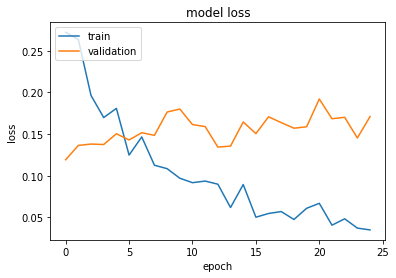

In [0]:
plot_loss(sat_hist)

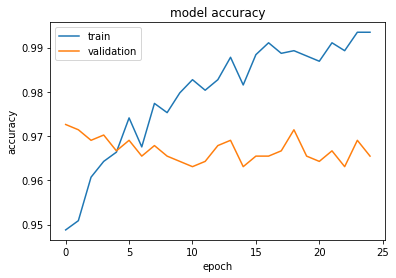

In [0]:
plot_accuracy(sat_hist)

##### Street Model

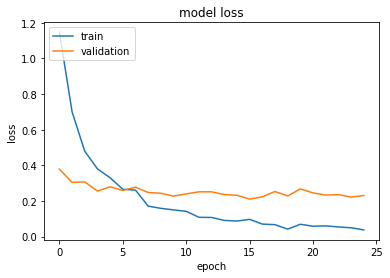

In [0]:
plot_loss(str_hist)

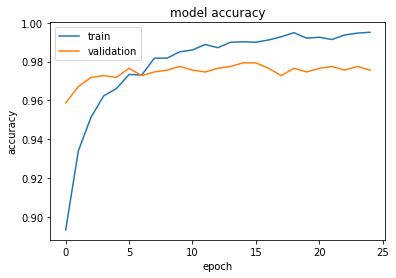

In [0]:
plot_accuracy(str_hist)

Q) You may observe that your validation metrics are better than your training metrics. Explain how this is possible? <br>

Answer: Primary reason for this is *high dropout*. During training, we disable a large number of neurons and (subsequent) layers attempt to get to right answers using incomplete representation. However, during validation, the model is more robust/ has higher computational power due to availability of all units, which *may* lead to better performance than during training.

Secondly, training metrics are computed as average across all batches in a training epoch, and weights across batches are being updated -- and hopefully becoming better. *Validation metrics are computed using the most recent (and likely to be better) weights, which may lead to better metrics than training metrics that were computed with samples from potentially worse states of our model*.

**Note:** I do get consistently better validation metrics than the training metrics for around first 5 epochs but this does not hold afterwards. Since I train for a large number of epochs (25) compared to the minimum asked for (1-2), the model becomes robust enough even in training phase and 'issues' stated above are no longer applicable.

#### Confusion Matrix
For each model, evaluate the model on the validation set (using the val_generators) then compute and print the confusion matrix. Pick appropriate evaluation metrics for a typical classification task and then comment on these metrics while justifying your reason for choosing these metrics (e.g. Talking about Precision and why precision is important etc.). Also, check and comment if your model is confused between some classes and explain why do you think that confusion lies in your opinion.
<br> Use Sci-kit Learn to compute the confusion matrix and plot it.

In [0]:
def plot_confusion_matrix(conf_mat):
    classes = ['freeway', 'mountain', 'palace', 'river', 'ship', 'stadium']
    df_cm = pd.DataFrame(conf_mat,classes,classes)
    plt.figure(figsize=(10,7))
    sns.set(font_scale=1.4)
    sns.heatmap(df_cm, annot=True,annot_kws={"size": 16})
    plt.show()

###### Satellite

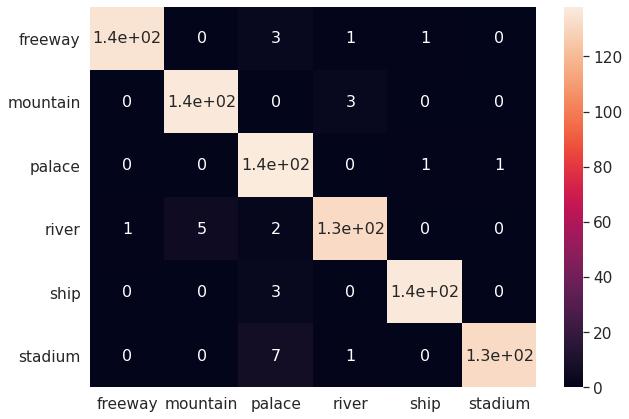

In [0]:
# Evaluation Metrics and Confusion Matrix for the satellite model
val_sat_generator.reset()

Y_pred = sat_classification_model.predict_generator(val_sat_generator, steps=ceil(val_sat_generator.samples/val_sat_generator.batch_size))
y_pred = np.argmax(Y_pred, axis=1)
y_true = val_sat_generator.classes[val_sat_generator.index_array]

conf_mat = confusion_matrix(y_true, y_pred)
plot_confusion_matrix(conf_mat)

**Analysis:**

Appropriate evaluation metrics:


1.   When we want to answer "*what proportion of predicted positives is truly positive?*" we use **precision**. Precision is generally high for all classes, which is good. *Relatively* though, precision is lower for freeway and river, which makes sense since other classes can be mistaken as these classes instead of say ship, which has more 'concrete' identity (shape, size etc.).
2.   When we want to answer "*what proportion of actual positives is correctly classified?*" we use **recall**. Recall is generally high for all classes too. *Relatively* though, recall is not as good for palace, which makes sense because satellite image of palace can be mistaken for other classes esp. stadium, both of which look like a building in satellite view.
3.   When we want to answer "*what proportion of images were correctly classified?*" we use **accuracy**. Here, we are looking for a larger picture, and not too concerned about individual classes. We already have seen accuracy plots above, and accuracy of >95% looks good.



###### Street

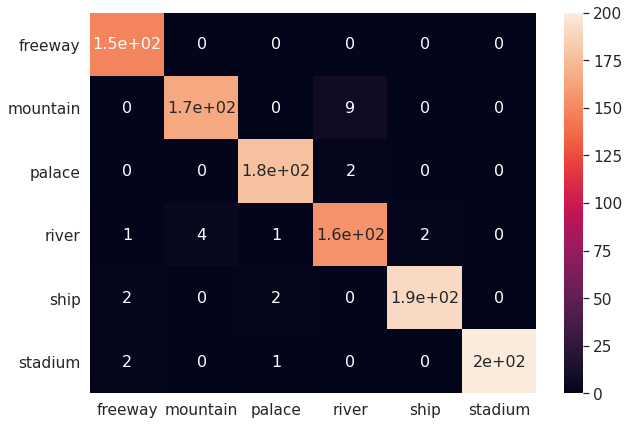

In [0]:
# Evaluation Metrics and Confusion Matrix for the street model
val_str_generator.reset()

Y_pred = str_classification_model.predict_generator(val_str_generator, steps=ceil(val_str_generator.samples/val_str_generator.batch_size))
y_pred = np.argmax(Y_pred, axis=1)
y_true = val_str_generator.classes[val_str_generator.index_array]

conf_mat = confusion_matrix(y_true, y_pred)
plot_confusion_matrix(conf_mat)

**Analysis:**

Appropriate evaluation metrics:


1.   When we want to answer "*what proportion of predicted positives is truly positive?*" we use **precision**. Precision is generally good in street view too. Freeway has perfect precision. Mountain has relatively low precision, and each time the model has been misled by river class, which makes sense since pictures of mountains may also have river flowing. River also has a relatively lower precision, with most false positives coming from mountain class.
2.   When we want to answer "*what proportion of actual positives is correctly classified?*" we use **recall**. Recall is generally high for all classes too. Stadium has perfect recall -- a street image of stadium is quickly/ easily distinguishable by humans. *Relatively* though, recall is not as good for rivers, and even freeway (was very high in satellite view though).

Rivers and mountains look like a pain point here. 
3.   When we want to answer "*what proportion of images were correctly classified?*" we use **accuracy**. Here, we are looking for a larger picture, and not too concerned about individual classes. We already have seen accuracy plots above, and accuracy of >95% looks good.



## Task 3 - Similarity Matching
This is the core of our CVIR system, where feature vectors of query images and search images will be compared and assigned a similarity score (or distance between these two vectors). We will be using the following distance metrics in order to compute similarity (distance is opposite of similarity,lower distance means more similar):

- Cosine
- DML

### Distance Metric Learning (DML)
Just like cosine, euclidean, and other metrics to compute distances between two feature vectors, we can create a Neural Network that can compute a distance metric for us given two input feature vectors. We will train a DML, (More about this: [ICONIP-CVIR](https://www.researchgate.net/publication/337862425_Cross-View_Image_Retrieval_-_Ground_to_Aerial_Image_Retrieval_Through_Deep_Learning)) which will take two feature vectors as input and output a label: 0 (Match, i.e. 0 distance between them) or 1 (No match, i.e. completely dissimilar feature vectors). The output layer of this DML will have a sigmoid activation and will output a continuous value between 0 and 1 which will be treated as the distance between these two feature vectors.

We're providing you with the Model Architecture, use this to create a Keras model using the Functional API:     
![DML](DML_Structure1.png)


In [0]:
# following DML_Structure_1.png image naming convention
def DML():
  input_3 = Input(shape=(1024,1))
  input_4 = Input(shape=(1024,1))
  reshape_3 = Reshape((32,32,1))(input_3)
  reshape_4 = Reshape((32,32,1))(input_4)
  concatenate_2 = concatenate(inputs=[reshape_3, reshape_4])
  conv2d_7 = Conv2D(filters=16, kernel_size=(7,7), padding='same')(concatenate_2)
  conv2d_8 = Conv2D(filters=16, kernel_size=(5,5), padding='same')(conv2d_7)
  conv2d_9 = Conv2D(filters=16, kernel_size=(3,3), padding='same')(conv2d_8)
  add_3 = add(inputs=[conv2d_9, conv2d_7])
  conv2d_11 = Conv2D(filters=16, kernel_size=(17,17))(add_3)
  conv2d_12 = Conv2D(filters=16, kernel_size=(5,5), padding='same')(conv2d_11)
  conv2d_10 = Conv2D(filters=16, kernel_size=(17,17))(add_3)
  add_4 = add(inputs=[conv2d_12, conv2d_10])
  leaky_re_lu_5 = LeakyReLU()(add_4)
  flatten_2 = Flatten()(leaky_re_lu_5)
  dense_5 = Dense(1024)(flatten_2)
  leaky_re_lu_6 = LeakyReLU()(dense_5)
  dense_6 = Dense(512)(leaky_re_lu_6)
  leaky_re_lu_7 = LeakyReLU()(dense_6)
  dense_7 = Dense(64)(leaky_re_lu_7)
  leaky_re_lu_8 = LeakyReLU()(dense_7)
  dense_8 = Dense(1)(leaky_re_lu_8)
  activation_2 = Activation(activation='sigmoid')(dense_8)

  return Model(inputs=[input_3, input_4], outputs=activation_2)

In [0]:
dml = DML()

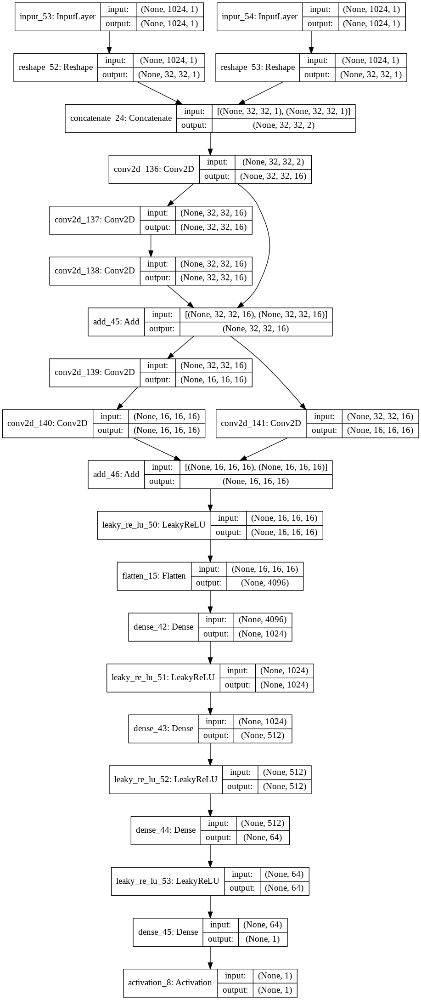

In [0]:
plot_model(dml, show_shapes=True)

#### Training the DML
We'll be providing you with DataFrames that contain the Train and Test data. You will realize that it is very useful to know how to create data generators when you want to yield data in a custom format. Use the DataFrame provided to create a generator and train your model. When yielding data be careful about your structure. The DML expects two inputs, so your generator should yield in this format: <br>  ( [ Satellite Feature Vector, Street Feature Vector ] ,Label )

Load the DataFrames

In [0]:
dml_train_df = pd.read_csv(main_dir+'dml_train.csv')
dml_test_df = pd.read_csv(main_dir+'dml_test.csv')

In [0]:
dml_train_df['sat_path'] = main_dir + dml_train_df['sat_path']
dml_train_df['str_path'] = main_dir + dml_train_df['str_path']
dml_test_df['sat_path'] = main_dir + dml_test_df['sat_path']
dml_test_df['str_path'] = main_dir + dml_test_df['str_path']

In [0]:
dml_test_df.head()

,sat_path,str_path,label
0,/content/drive/My Drive/Colab Notebooks/DL_HW4...,/content/drive/My Drive/Colab Notebooks/DL_HW4...,0
1,/content/drive/My Drive/Colab Notebooks/DL_HW4...,/content/drive/My Drive/Colab Notebooks/DL_HW4...,1
2,/content/drive/My Drive/Colab Notebooks/DL_HW4...,/content/drive/My Drive/Colab Notebooks/DL_HW4...,0
3,/content/drive/My Drive/Colab Notebooks/DL_HW4...,/content/drive/My Drive/Colab Notebooks/DL_HW4...,0
4,/content/drive/My Drive/Colab Notebooks/DL_HW4...,/content/drive/My Drive/Colab Notebooks/DL_HW4...,0


**IMPORTANT**: Training the DML can take very long considering the overhead (Loading image, Passing it in the Feature Vector Extraction model to get the feature vector, yielding this Feature Vector in the generator).    
In order to speed up training and reduce this overhead, we can perform the training in two passes:

1) Use Feature Vector Extraction Models to extract feature vectors and store this feature vectors to disk.
2) Create a Data Generator that loads yields these feature vectors to train the DML

We have already performed step 1 for you using the pre-trained weights provided to you. The features of each image are stored in the Features/ directory. The paths are already included in the dataframes provided to you.

Q: How would you extract feature vectors from your classification models if we treat the output of the last 1024 dense layer as the Feature Vector of an Image? Write a code snippet that creates a model (Using either sat/str classification model) that takes an Image as an input and outputs its feature vector. Print this model's summary

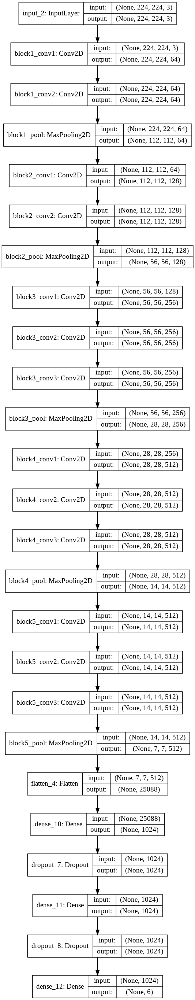

In [0]:
sat_classication_model = load_model(main_dir+'Models/Sat-01-0.12.h5')
str_classification_model = load_model(main_dir+'Models/Str-16-0.21.h5')
plot_model(str_classification_model, show_shapes=True)

In [0]:
im_path = main_dir+'StreetView/Images/stadium/98046758_aa002f9e2b_o.jpg'
img = cv2.imread(im_path)

# optional: to keep aspect ratio intact, turn image into square image first

# make image to square image by adding 0s/ black boundaries
# img.shape
# s = max(img.shape[0:2])
# square_img = np.zeros((s,s,3),np.uint8)
# #Getting the centering position
# ax,ay = (s - img.shape[1])//2,(s - img.shape[0])//2
# #Pasting the 'image' in a centering position
# square_img[ay:img.shape[0]+ay,ax:ax+img.shape[1]] = img
# square_img.shape
# img = square_img

input_img = cv2.resize(img, (224,224))
input_img.shape
input_img = input_img.reshape((1,224,224,3))
input_img.shape
fv_extractor = Model(inputs = str_classification_model.get_layer('input_2').input, outputs = str_classification_model.get_layer('dense_11').output)
fv = fv_extractor.predict(input_img)

In [0]:
fv

array([[ 0.       ,  2.68654  ,  0.       , ..., 19.668747 ,  0.       ,
         1.9278369]], dtype=float32)

**Note**: If you want to use your trained model to recompute features and train the DML on your own feature vectors, you're free to do that. Run the function below but it will take very long to compute the features. You can optimize this function by carrying computations in batches if you want to.

In [0]:
def compute_features():
    sat_imgs = glob('SatView/Images/**/*')
    str_imgs = glob('StreetView/Images/**/*')
    
    if not os.path.exists('SatView/Features'):
        os.mkdir('SatView/Features')
    if not os.path.exists('StreetView/Features'):
        os.mkdir('StreetView/Features')
    print("Computing for Satellite Images")
    for f in sat_imgs:
        img = get_image(f)
        base_path = 'SatView/Features/'
        filename = f.split('/')[-1].split('.')[0]
        ext = '.npy'
        fv = sat_fv_extractor.predict(np.expand_dims(img,axis=0)).reshape(1024,1)
        save_at = base_path + filename + ext
        if not os.path.exists(save_at):
            np.save(save_at,fv)
            
    print("Computing for Street Images")
    for f in str_imgs:
        img = get_image(f)
        base_path = 'StreetView/Features/'
        filename = f.split('/')[-1].split('.')[0]
        ext = '.npy'
        fv = str_fv_extractor.predict(np.expand_dims(img,axis=0)).reshape(1024,1)
        save_at = base_path + filename + ext
        if not os.path.exists(save_at):
            np.save(save_at,fv)

Create a Data Generator for training the DML

In [0]:
def dml_data_generator(df, batch_size = 32, mode='train'):
    num_examples = df.shape[0]
    batch_starts = np.arange(0, num_examples, batch_size)
    np.random.shuffle(batch_starts)  # to randomize batch selection
    
    while True:  # Keras generators must be infinite
        for batch_start in batch_starts:
            Sat_FVs, Str_FVs, Labels = [], [], []
            batch_end = min(batch_start+batch_size, num_examples)
            
            for i in range(batch_start, batch_end):
                sat_fv = np.load(df['sat_path'][i])
                str_fv = np.load(df['str_path'][i])
                Sat_FVs.append(sat_fv)
                Str_FVs.append(str_fv)
                Labels.append(int(df['label'][i]))
            
            Sat_FVs = np.array(Sat_FVs)
            Str_FVs = np.array(Str_FVs)
            
            yield ([Sat_FVs, Str_FVs], Labels)

In [0]:
dml_train_gen = dml_data_generator(dml_train_df,batch_size=BATCH_SIZE)
dml_test_gen = dml_data_generator(dml_test_df,batch_size=BATCH_SIZE)

Add any callbacks you want to

In [0]:
# Callbacks for DML go here
if not os.path.exists(main_dir+'DML'):
    os.mkdir(main_dir+'DML/')

checkpoint = ModelCheckpoint(main_dir+'DML/'+'{epoch:02d}-{val_loss:.2f}.h5', 
                             monitor='val_loss', save_best_only=True,
                             verbose=1, mode='auto')
csvlogger = CSVLogger(main_dir+'DML/DML_logs.csv', separator=',', append=False)

callbacks = [checkpoint, csvlogger]

Now, train the DML model on the provided dataset. You are free to tweak the hyperparameters of this model. Unlike the previous assignment, the accuracy of your DML will matter when grading your assignment. You can try different optimizers, learning rates, and if you want to, you can tweak the DML model as well but the overall structure should remain the same.

In [0]:
# Compile
opt = Adam(lr=0.00001)

dml.compile(loss='binary_crossentropy', optimizer=opt, metrics=['accuracy'])

dml_hist = dml.fit_generator(
    dml_train_gen,
    steps_per_epoch= ceil(dml_train_df.shape[0]/BATCH_SIZE),
    epochs=30,
    validation_data=dml_test_gen,
    validation_steps= ceil(dml_test_df.shape[0]/BATCH_SIZE),
    callbacks=callbacks,
    verbose=1
)

Epoch 1/30
1050/1050 [==============================] - 129s 123ms/step - loss: 0.6572 - acc: 0.6074 - val_loss: 0.5843 - val_acc: 0.6992

Epoch 00001: val_loss improved from inf to 0.58430, saving model to /content/drive/My Drive/Colab Notebooks/DL_HW4/DML/01-0.58.h5
Epoch 2/30
1050/1050 [==============================] - 124s 118ms/step - loss: 0.5420 - acc: 0.7255 - val_loss: 0.5151 - val_acc: 0.7460

Epoch 00002: val_loss improved from 0.58430 to 0.51512, saving model to /content/drive/My Drive/Colab Notebooks/DL_HW4/DML/02-0.52.h5
Epoch 3/30
1050/1050 [==============================] - 125s 119ms/step - loss: 0.4892 - acc: 0.7671 - val_loss: 0.4703 - val_acc: 0.7832

Epoch 00003: val_loss improved from 0.51512 to 0.47025, saving model to /content/drive/My Drive/Colab Notebooks/DL_HW4/DML/03-0.47.h5
Epoch 4/30
1050/1050 [==============================] - 124s 118ms/step - loss: 0.4438 - acc: 0.7989 - val_loss: 0.4340 - val_acc: 0.8064

Epoch 00004: val_loss improved from 0.47025 to

In [0]:
# Compile
opt = Nadam(lr=0.00001)

dml.compile(loss='binary_crossentropy', optimizer=opt, metrics=['accuracy'])

dml_hist2 = dml.fit_generator(
    dml_train_gen,
    steps_per_epoch= ceil(dml_train_df.shape[0]/BATCH_SIZE),
    epochs=25,
    validation_data=dml_test_gen,
    validation_steps= ceil(dml_test_df.shape[0]/BATCH_SIZE),
    callbacks=callbacks,
    verbose=1
)

Epoch 1/25
1050/1050 [==============================] - 129s 122ms/step - loss: 0.1171 - acc: 0.9599 - val_loss: 0.2473 - val_acc: 0.9054

Epoch 00001: val_loss improved from 0.29363 to 0.24731, saving model to /content/drive/My Drive/Colab Notebooks/DL_HW4/DML/01-0.25.h5
Epoch 2/25
1050/1050 [==============================] - 123s 117ms/step - loss: 0.1087 - acc: 0.9644 - val_loss: 0.2475 - val_acc: 0.9057

Epoch 00002: val_loss did not improve from 0.24731
Epoch 3/25
1050/1050 [==============================] - 125s 119ms/step - loss: 0.1014 - acc: 0.9682 - val_loss: 0.2485 - val_acc: 0.9063

Epoch 00003: val_loss did not improve from 0.24731
Epoch 4/25
1050/1050 [==============================] - 123s 118ms/step - loss: 0.0944 - acc: 0.9715 - val_loss: 0.2495 - val_acc: 0.9069

Epoch 00004: val_loss did not improve from 0.24731
Epoch 5/25
1050/1050 [==============================] - 125s 119ms/step - loss: 0.0878 - acc: 0.9751 - val_loss: 0.2518 - val_acc: 0.9064

Epoch 00005: val_l

Best model metrics: <br>
Loss: **0.24731** <br>
Accuracy: **0.9054**

###### Plot DML Accuracy and Loss

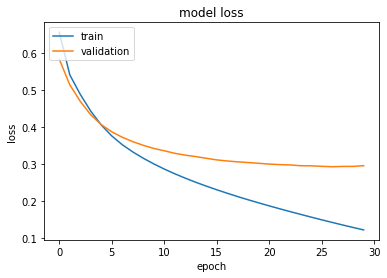

In [0]:
plot_loss(dml_hist)

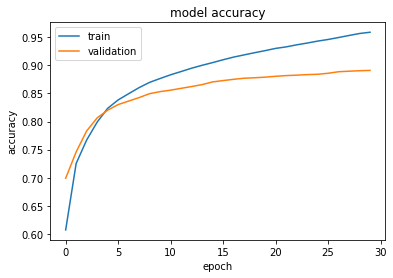

In [0]:
plot_accuracy(dml_hist)

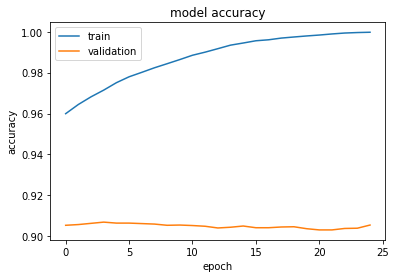

In [0]:
plot_accuracy(dml_hist2)

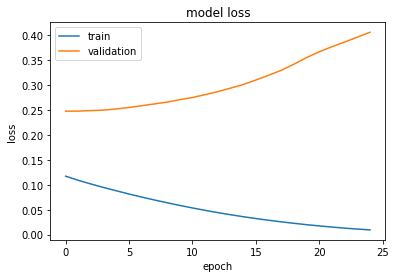

In [0]:
plot_loss(dml_hist2)

Q) Comment on your DML model's bias and variance. <br>
Answer: *Commenting on dml_hist and not dml_hist2, since latter starts with already well-trained weights.* <br>
The final model has very *low bias* and *high variance*. I have run my model for 30 epochs, and the model being sufficiently complex has been able to overfit after this, which is also evident from training accuracy being more than 5% higher than validation accuracy. Bias consistently decreases with more epochs/ increasing model complexity whereas variance increases. Loss starts to increase after 30 epochs (more evident in dml_hist2).

### Computing Similarity between Query Image and a Search Image

In [0]:
def sort_by_value(dict_obj):
    return collections.OrderedDict(sorted(dict_obj.items(), key=lambda kv: kv[1]))

Create a function that takes in a query image's Feature Vector (Or its path more precisely, a real system takes in a image but for our purposes we'll use feature vectors to speed up retrieval), and a Database which contains images their view and class labels (This will be provided to you). In this function you need to:    
    - Load the Feature Vector of the Query Image
    - For each image OF THE OPPOSITE VIEW in the database:
            - Load the feature vector of the search image
            - Get a distance score based on the metric argument
            - Store the result
    - Store all results in a Python Dictionary in which the keys are the paths to retrieved images, and values are the distance scores.
    - Return the sorted results dictionary (Use the sort_by_value function)

**IMPORTANT:** When passing in inputs to the DML in predict, you need to reshape your reshape your Feature Vector to (1,1024,1). It's the same as saying that you're passing in data with a batch_size of 1. You can predict in batches but then you will also need to figure out how to store the results in the final sorted dictionary.

The get_similar function will expect a DataFrame (Database arugment) that stores information about the images in our database, you don't have to worry about this since we will provide you with this DataFrame.

In [47]:
# Load your best DML Model here
dml = load_model(main_dir+'DML/01-0.25.h5')
# dml = tf.keras.models.load_model(main_dir+'DML/01-0.25.h5')

Instructions for updating:
If using Keras pass *_constraint arguments to layers.


In [48]:
sat_fv = np.load(main_dir+'SatView/Features/ship_070.npy').reshape(1,1024,1)
str_fv = np.load(main_dir+'StreetView/Features/9403195923_f7c3415911_o.npy').reshape(1,1024,1)
dml_score = dml.predict([sat_fv, str_fv])
cos_score = cosine(sat_fv, str_fv)
print(dml_score, cos_score)

[[0.9998559]] 0.649634450674057


In [0]:
def get_similar(query_fv_path,database,metric='dml',query_view='str',batch_size=32):
    results = {}
    query_fv = np.load(query_fv_path).reshape(1,1024,1)

    if query_view == 'sat':
        opp_db = database[database['view']=='str']
        for i in (opp_db.shape[0]):
            fv_path = opp_db['fv_path'].iloc[i]
            fv = np.load(fv_path).reshape(1,1024,1)
            if metric == 'dml':
                match = dml.predict([query_fv, fv])
            elif metric == 'cosine':
                match = cosine(query_fv, fv)
            results[fv_path] = match

    elif query_view == 'str':
        opp_db = database[database['view']=='sat']
        for i in range(opp_db.shape[0]):
            fv_path = opp_db['fv_path'].iloc[i]
            fv = np.load(fv_path).reshape(1,1024,1)
            if metric == 'dml':
                match = dml.predict([fv, query_fv])  # order matters here
            elif metric == 'cosine':
                match = cosine(query_fv, fv)  # order does not matter here
            results[fv_path] = match

    else:
        print(query_view + 'not recognized')

    return sort_by_value(results)

## Task 4 - Image Retrieval
Now its time to put it all together and run our CVIR system.

In [0]:
def view_results(results_dict,n=5):
    fig = figure(figsize=(15,15))
    files = list(results_dict.keys())
    for i in range(n):
        a=fig.add_subplot(1,n,i+1)
        image = imread(files[i])
        imshow(image)
        axis('off')

In [0]:
def get_db(df,imgs_per_classes=5):
    classes = ['freeway','mountain','palace','river','ship', 'stadium']
    sat_df = df[df['view'] == 'sat']
    str_df = df[df['view'] == 'str']
    db = pd.DataFrame({},columns=df.columns)
    for c in classes:
        sat_sample = sat_df[sat_df['class'] == c].sample(imgs_per_classes,random_state=ROLLNUMBER)
        str_sample = str_df[str_df['class'] == c].sample(imgs_per_classes,random_state=ROLLNUMBER)
        db = pd.concat([db,sat_sample,str_sample])
    return db.sample(frac=1,random_state=ROLLNUMBER).reset_index(drop=True)

In [52]:
full_database = pd.read_csv(main_dir+'Retrieval_Database.csv')
full_database.tail()

,img_path,view,class,fv_path
1195,SatView/Images/palace/palace_016.jpg,sat,palace,SatView/Features/palace_016.npy
1196,SatView/Images/freeway/freeway_111.jpg,sat,freeway,SatView/Features/freeway_111.npy
1197,StreetView/Images/palace/34060748830_1db055dfc...,str,palace,StreetView/Features/34060748830_1db055dfcd_o.npy
1198,StreetView/Images/ship/16425656786_a18869e0dc_...,str,ship,StreetView/Features/16425656786_a18869e0dc_o.npy
1199,StreetView/Images/mountain/22785387786_2da022a...,str,mountain,StreetView/Features/22785387786_2da022a360_o.npy


In [53]:
# colab appears to require full path
full_database['img_path'] = main_dir + full_database['img_path']
full_database['fv_path'] = main_dir + full_database['fv_path']
full_database.tail()

,img_path,view,class,fv_path
1195,/content/drive/My Drive/Colab Notebooks/DL_HW4...,sat,palace,/content/drive/My Drive/Colab Notebooks/DL_HW4...
1196,/content/drive/My Drive/Colab Notebooks/DL_HW4...,sat,freeway,/content/drive/My Drive/Colab Notebooks/DL_HW4...
1197,/content/drive/My Drive/Colab Notebooks/DL_HW4...,str,palace,/content/drive/My Drive/Colab Notebooks/DL_HW4...
1198,/content/drive/My Drive/Colab Notebooks/DL_HW4...,str,ship,/content/drive/My Drive/Colab Notebooks/DL_HW4...
1199,/content/drive/My Drive/Colab Notebooks/DL_HW4...,str,mountain,/content/drive/My Drive/Colab Notebooks/DL_HW4...


In [0]:
database = get_db(full_database,imgs_per_classes=5)

Finally, put all functions together to perform a search. We will be using **Street View Images as our queries** <br>
For **EACH** class, pick one query image from the database provided to you, and then search for its results. **You also need to perform these searches for BOTH metrics (Cosine and DML)** and then analyze and comment on each metric's performance. Try and see if you can find queries/classes for which your system does not perform well.

In [0]:
# returns dictionary of length num_results with file path as keys and metric score as values
def search(query_fv_path,database,dist_metric='dml',num_results=5):
    sim = get_similar(query_fv_path,database,metric=dist_metric,query_view='str')
    top_sim = {k:sim[k] for k in list(sim.keys())[:num_results]}
    return top_sim

### Retrievals

##### Using Cosine Distance




Query Image: Street View of  mountain


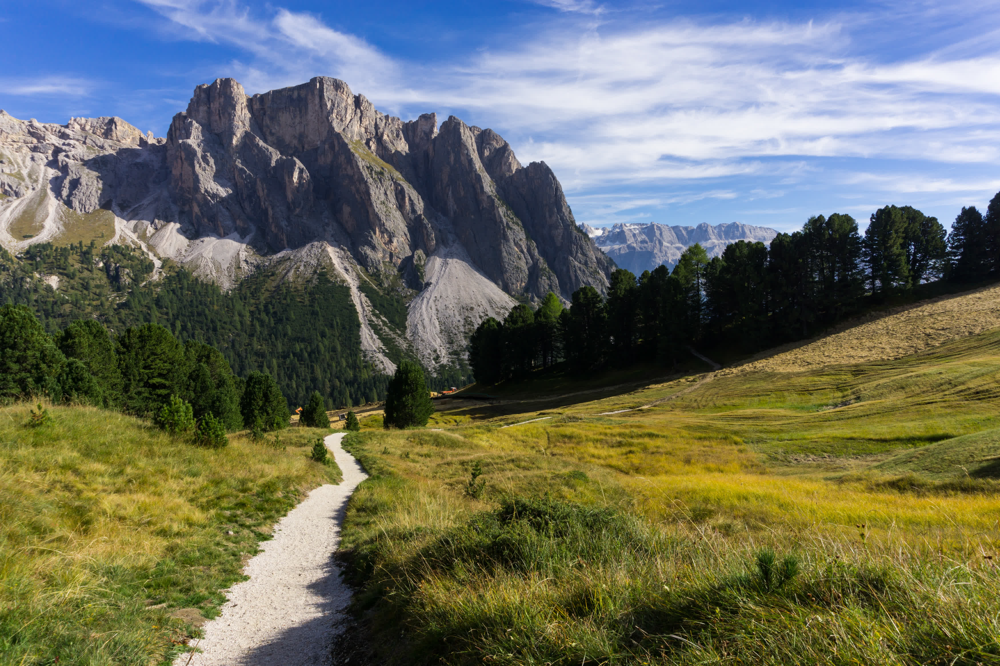


Top Matching Satellite Images:
/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/stadium/stadium_607.jpg


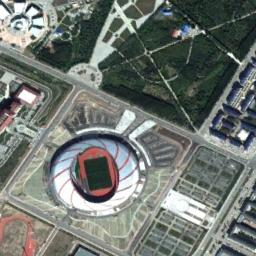

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/stadium/stadium_549.jpg


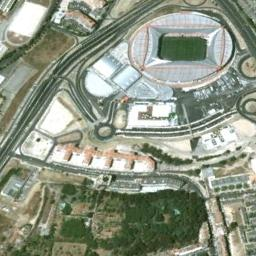

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/stadium/stadium_315.jpg


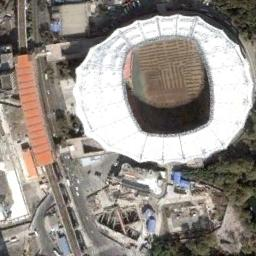

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/ship/ship_400.jpg


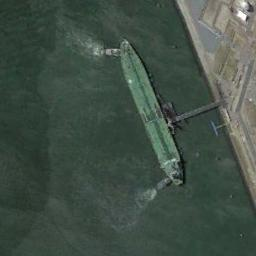

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/ship/ship_099.jpg


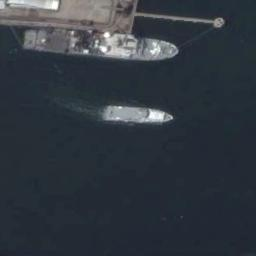

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/ship/ship_070.jpg


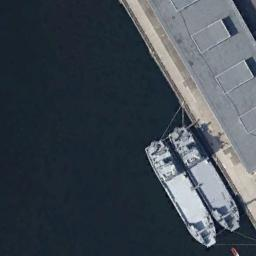

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/palace/palace_432.jpg


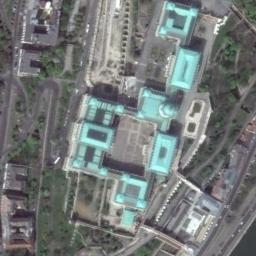

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/palace/palace_055.jpg


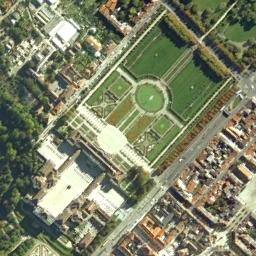

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/ship/ship_403.jpg


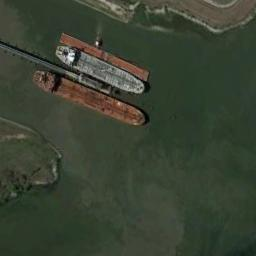

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/ship/ship_668.jpg


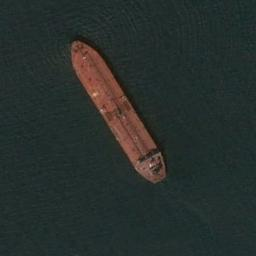

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/palace/palace_421.jpg


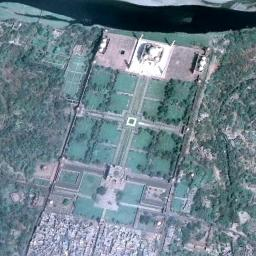

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/ship/ship_363.jpg


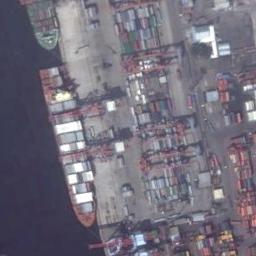

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/stadium/stadium_575.jpg


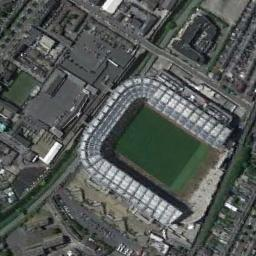

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/stadium/stadium_161.jpg


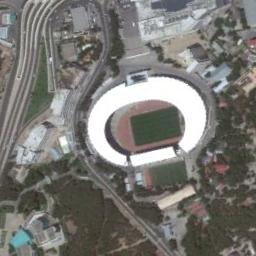

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/ship/ship_336.jpg


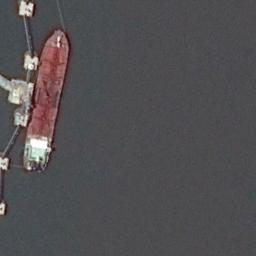

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/ship/ship_157.jpg


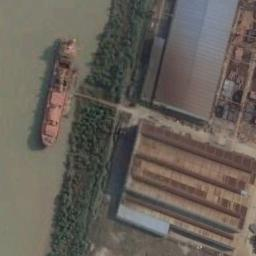

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/stadium/stadium_178.jpg


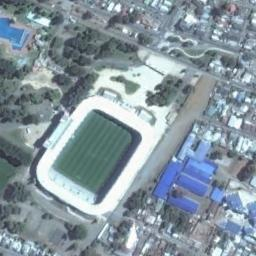

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/stadium/stadium_587.jpg


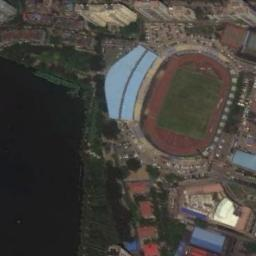

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/palace/palace_260.jpg


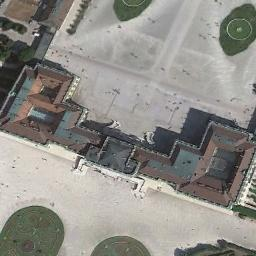

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/freeway/freeway_104.jpg


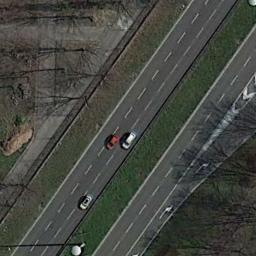




Query Image: Street View of  river


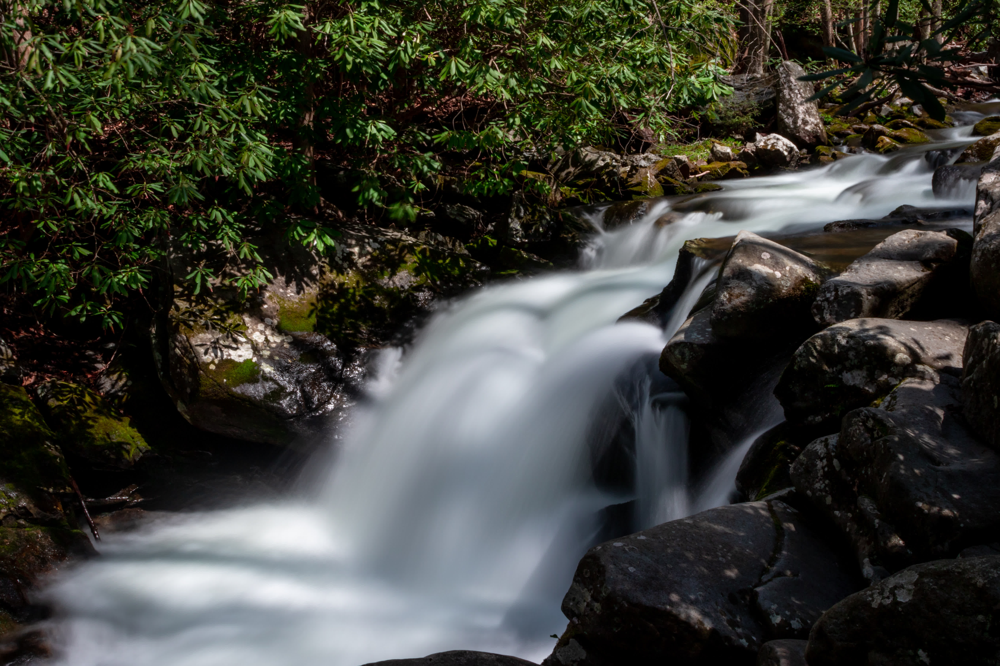


Top Matching Satellite Images:
/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/stadium/stadium_607.jpg


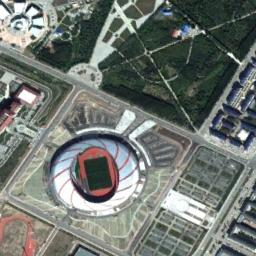

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/palace/palace_260.jpg


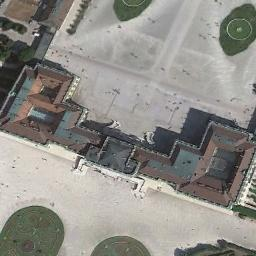

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/stadium/stadium_315.jpg


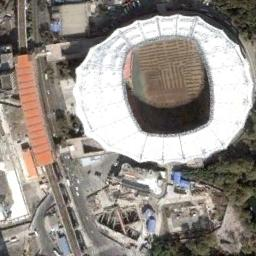

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/ship/ship_403.jpg


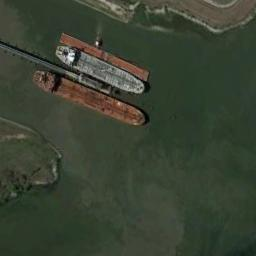

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/freeway/freeway_119.jpg


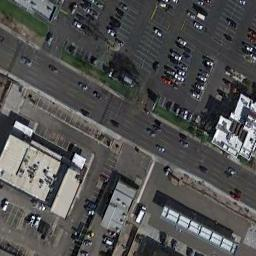

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/stadium/stadium_549.jpg


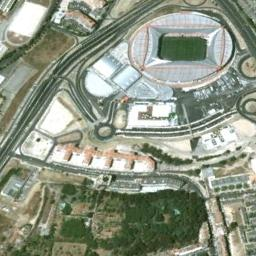

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/palace/palace_055.jpg


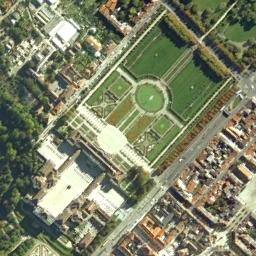

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/palace/palace_432.jpg


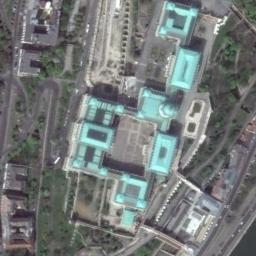

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/ship/ship_400.jpg


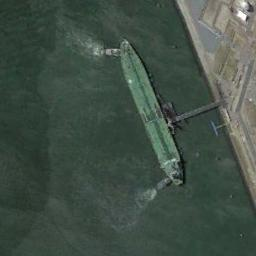

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/ship/ship_157.jpg


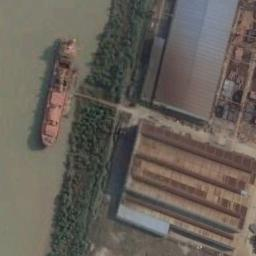

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/ship/ship_107.jpg


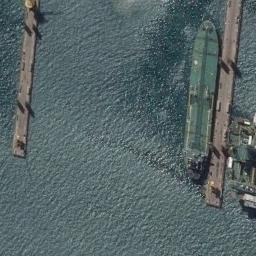

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/mountain/mountain_264.jpg


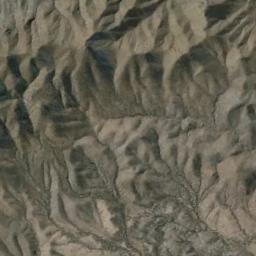

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/palace/palace_070.jpg


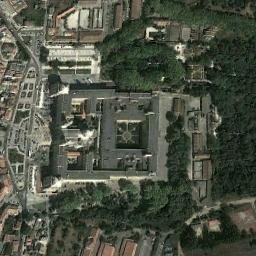

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/freeway/freeway_104.jpg


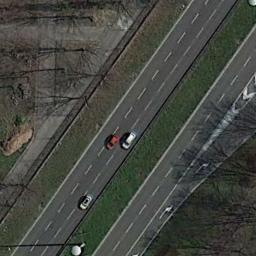

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/palace/palace_653.jpg


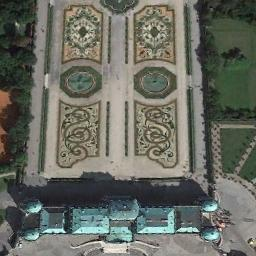

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/mountain/mountain_319.jpg


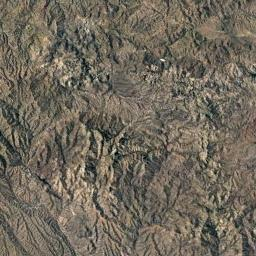

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/palace/palace_332.jpg


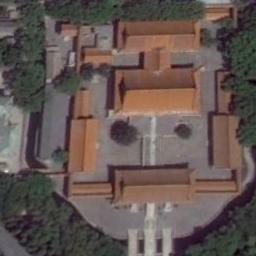

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/ship/ship_336.jpg


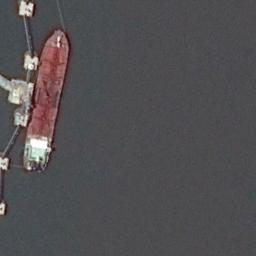

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/ship/ship_144.jpg


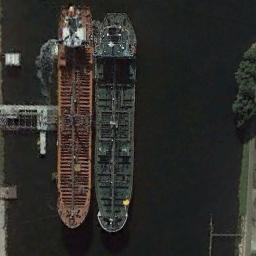

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/mountain/mountain_222.jpg


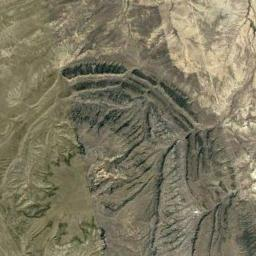




Query Image: Street View of  freeway


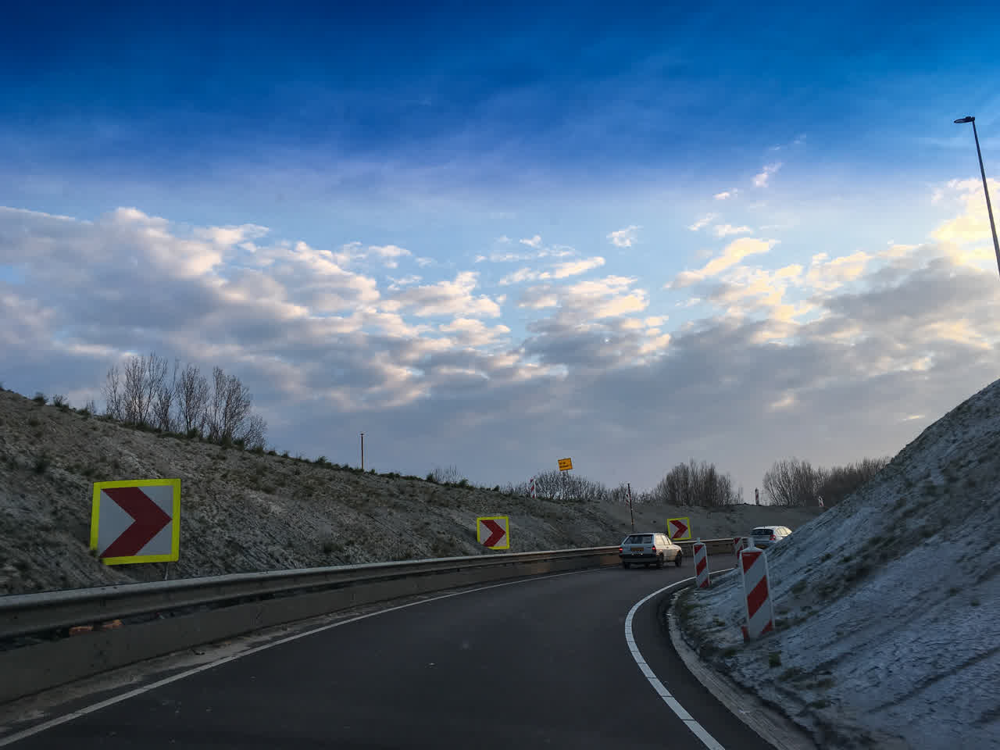


Top Matching Satellite Images:
/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/palace/palace_260.jpg


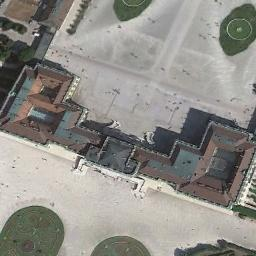

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/palace/palace_055.jpg


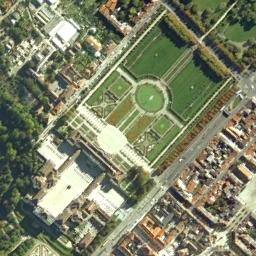

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/freeway/freeway_022.jpg


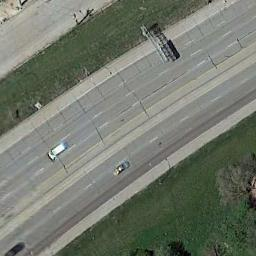

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/ship/ship_403.jpg


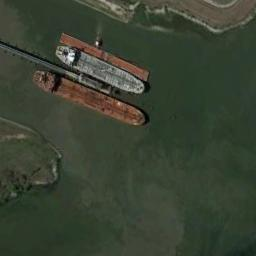

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/palace/palace_653.jpg


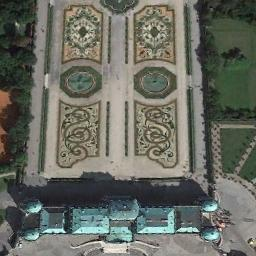

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/stadium/stadium_607.jpg


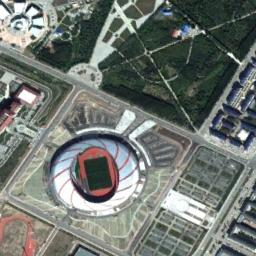

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/ship/ship_070.jpg


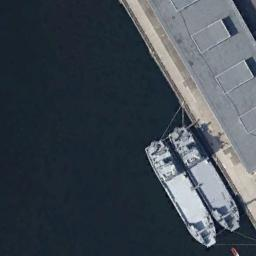

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/freeway/freeway_070.jpg


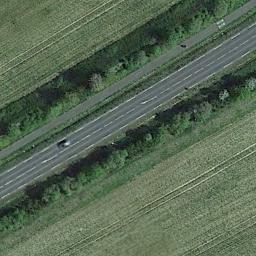

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/freeway/freeway_357.jpg


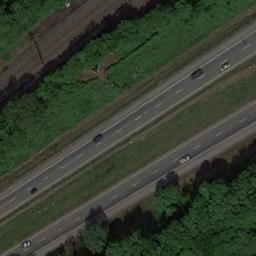

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/river/river_279.jpg


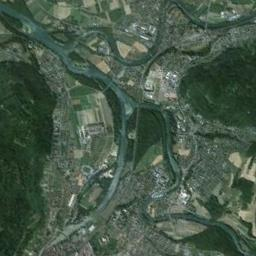

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/ship/ship_521.jpg


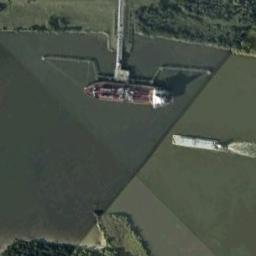

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/freeway/freeway_111.jpg


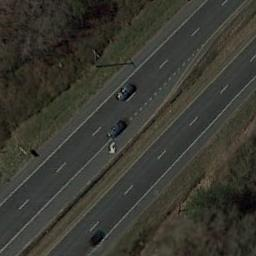

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/ship/ship_099.jpg


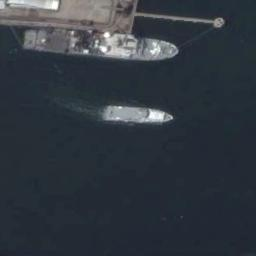

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/ship/ship_400.jpg


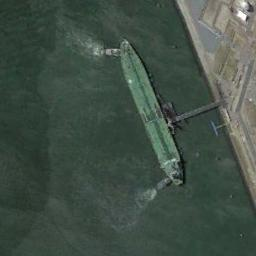

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/ship/ship_157.jpg


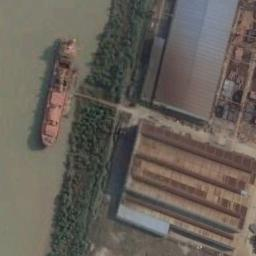

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/ship/ship_363.jpg


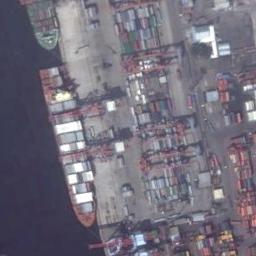

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/palace/palace_196.jpg


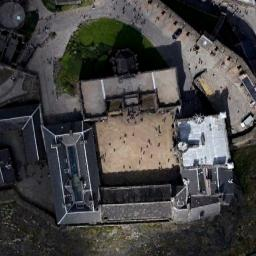

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/freeway/freeway_236.jpg


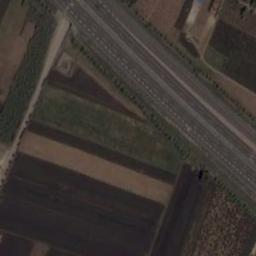

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/palace/palace_332.jpg


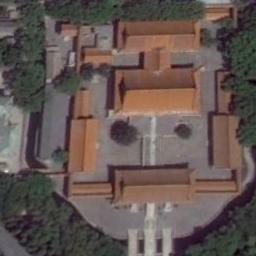

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/palace/palace_070.jpg


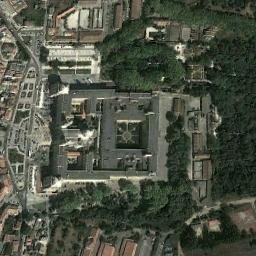




Query Image: Street View of  stadium


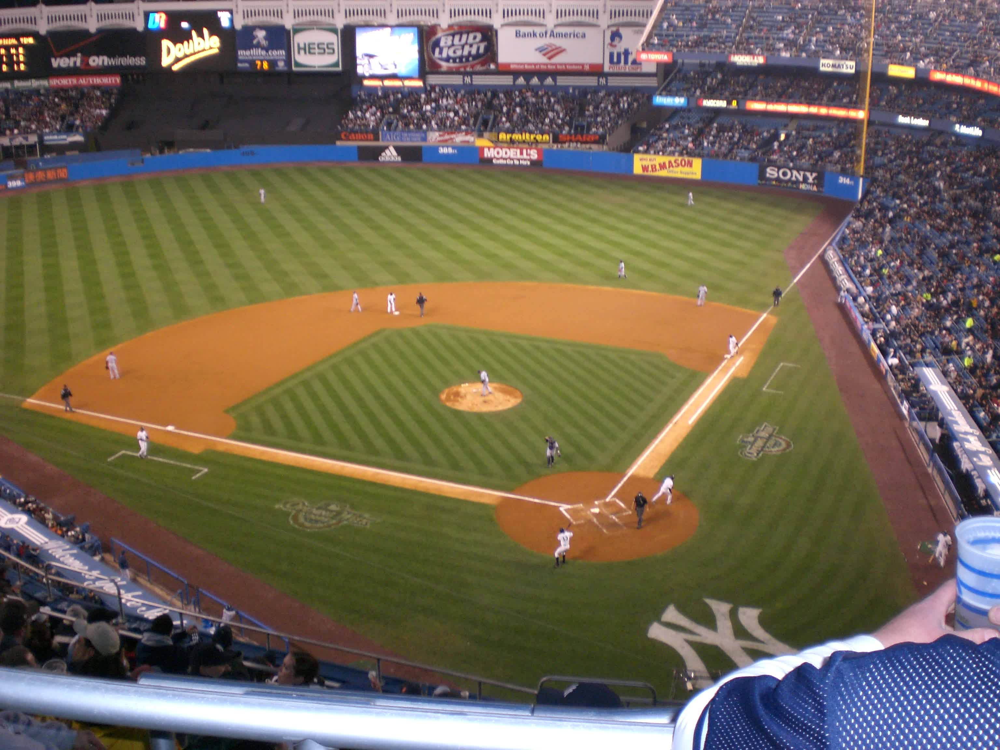


Top Matching Satellite Images:
/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/stadium/stadium_607.jpg


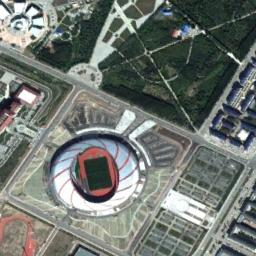

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/river/river_279.jpg


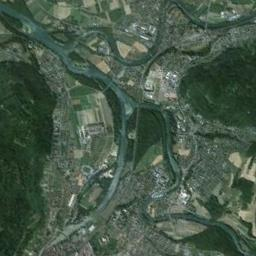

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/stadium/stadium_644.jpg


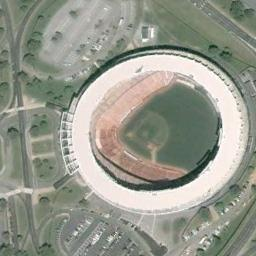

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/ship/ship_099.jpg


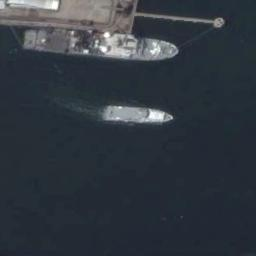

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/stadium/stadium_315.jpg


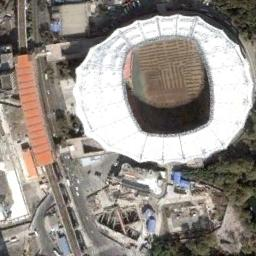

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/ship/ship_403.jpg


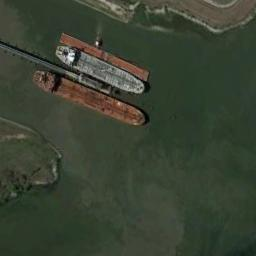

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/freeway/freeway_109.jpg


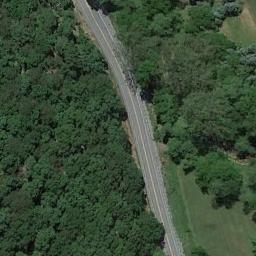

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/ship/ship_471.jpg


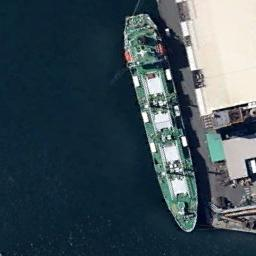

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/stadium/stadium_145.jpg


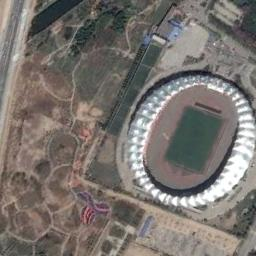

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/freeway/freeway_022.jpg


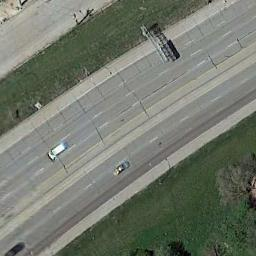

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/palace/palace_055.jpg


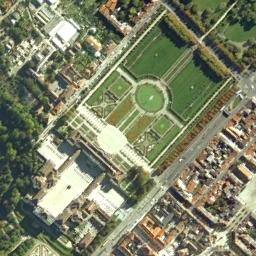

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/ship/ship_070.jpg


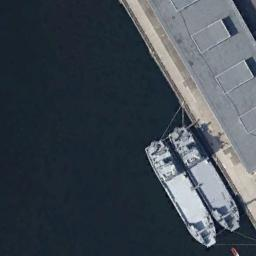

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/stadium/stadium_549.jpg


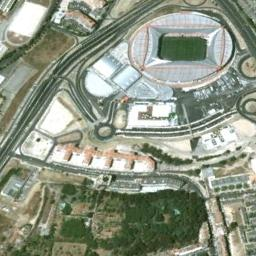

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/stadium/stadium_178.jpg


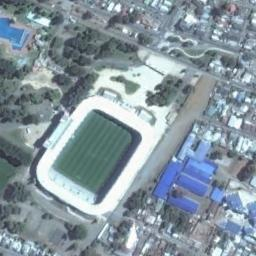

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/ship/ship_345.jpg


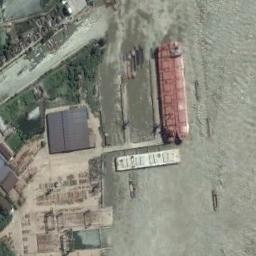

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/ship/ship_271.jpg


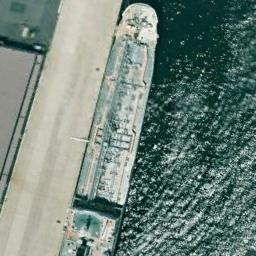

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/mountain/mountain_264.jpg


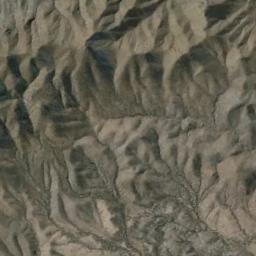

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/stadium/stadium_587.jpg


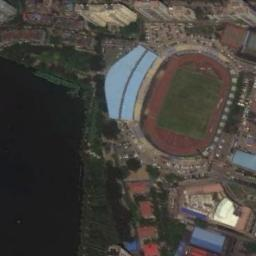

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/mountain/mountain_319.jpg


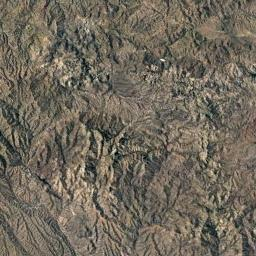

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/river/river_278.jpg


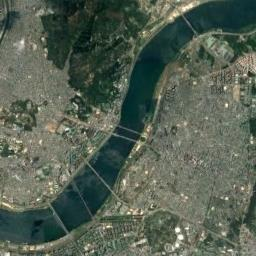




Query Image: Street View of  ship


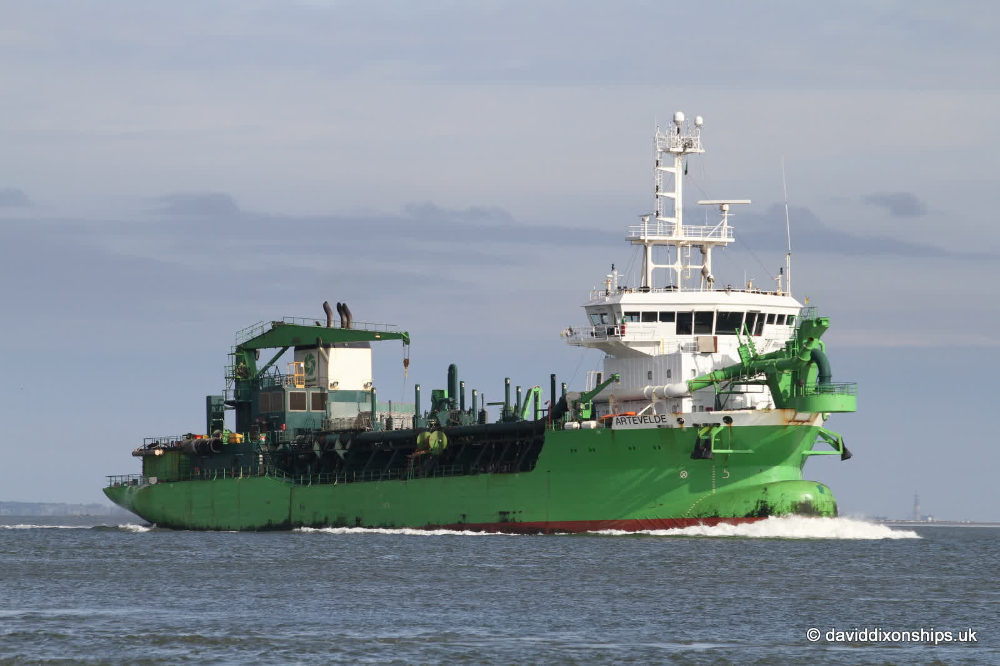


Top Matching Satellite Images:
/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/stadium/stadium_607.jpg


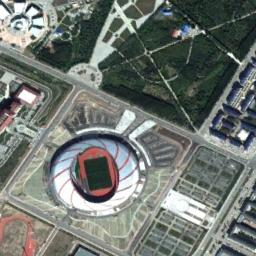

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/ship/ship_070.jpg


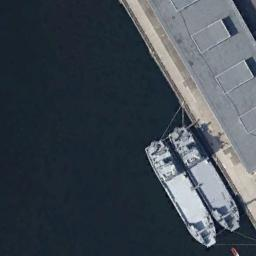

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/ship/ship_403.jpg


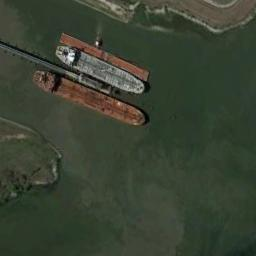

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/palace/palace_260.jpg


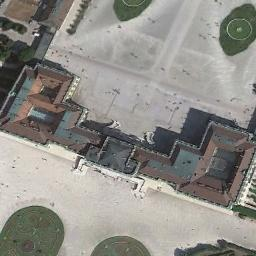

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/palace/palace_196.jpg


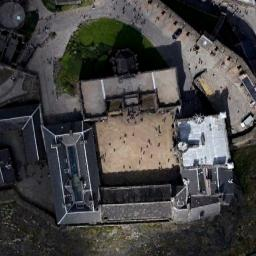

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/ship/ship_157.jpg


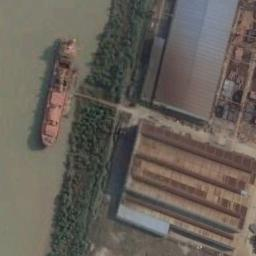

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/stadium/stadium_178.jpg


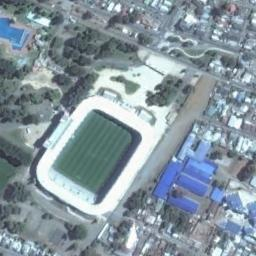

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/ship/ship_427.jpg


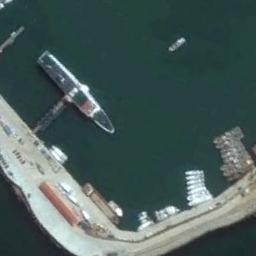

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/ship/ship_400.jpg


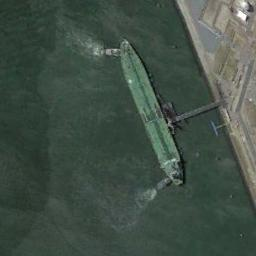

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/river/river_279.jpg


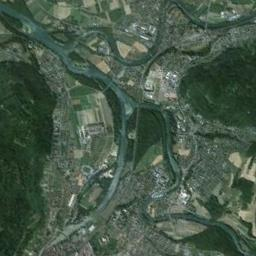

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/palace/palace_055.jpg


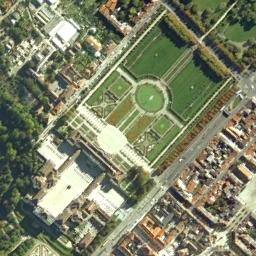

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/ship/ship_098.jpg


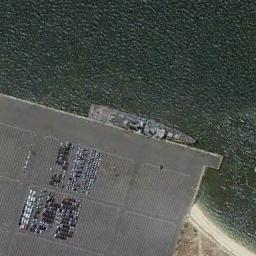

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/ship/ship_521.jpg


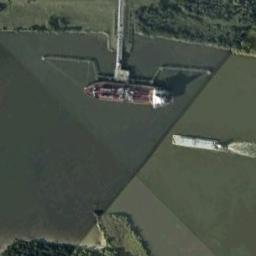

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/river/river_137.jpg


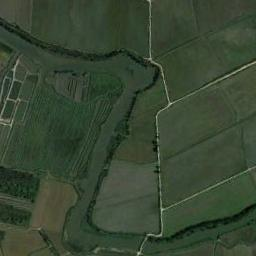

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/ship/ship_039.jpg


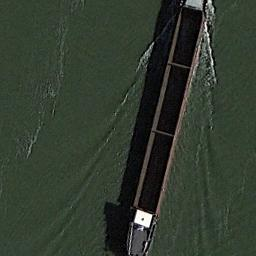

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/freeway/freeway_111.jpg


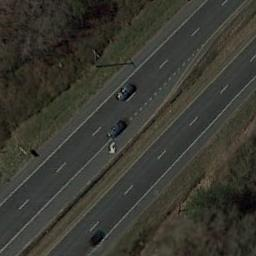

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/freeway/freeway_022.jpg


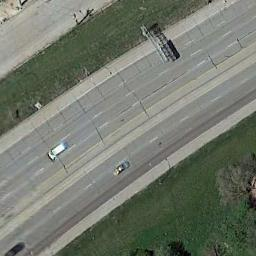

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/mountain/mountain_463.jpg


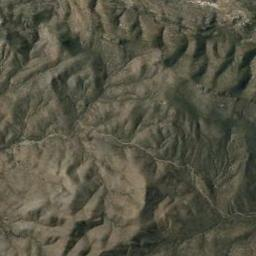

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/river/river_695.jpg


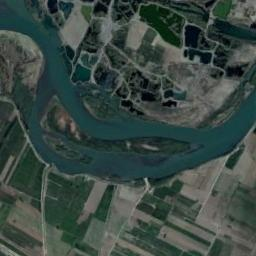

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/palace/palace_421.jpg


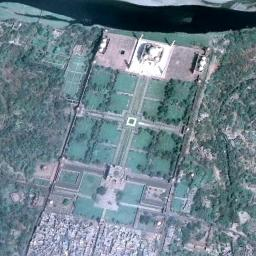




Query Image: Street View of  palace


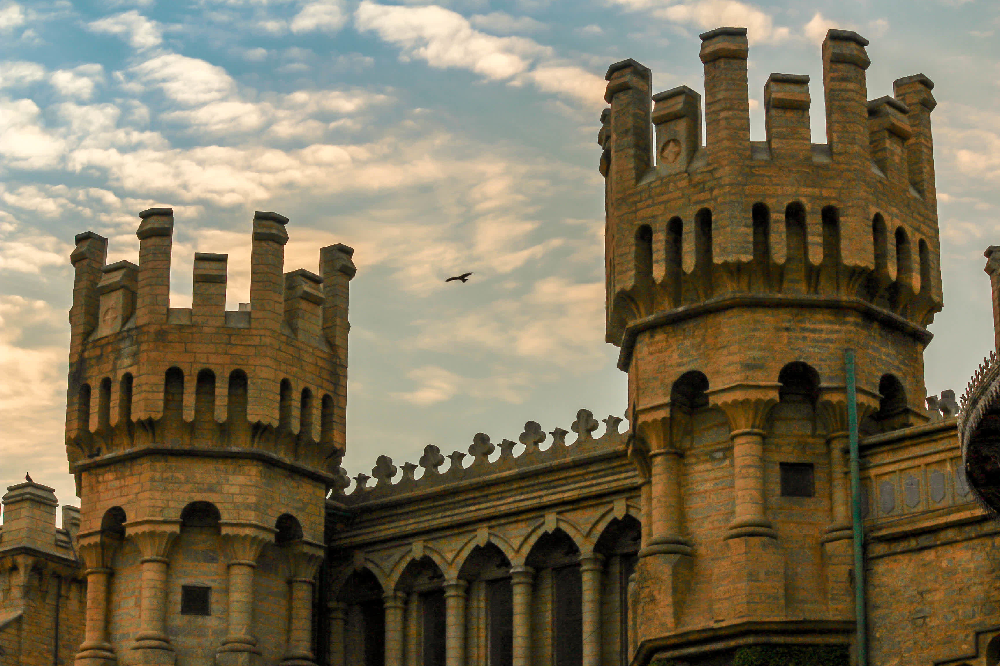


Top Matching Satellite Images:
/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/stadium/stadium_607.jpg


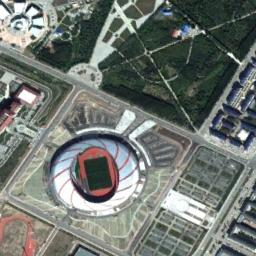

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/palace/palace_432.jpg


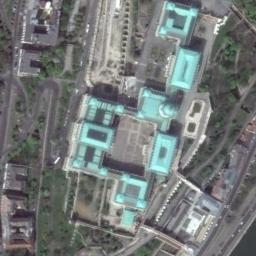

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/palace/palace_260.jpg


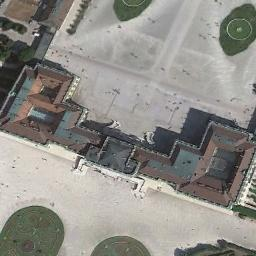

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/palace/palace_196.jpg


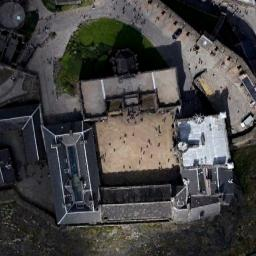

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/ship/ship_099.jpg


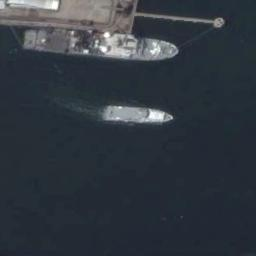

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/freeway/freeway_119.jpg


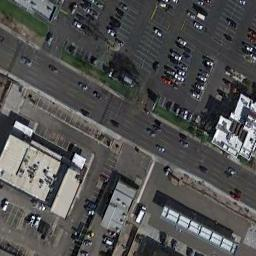

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/stadium/stadium_161.jpg


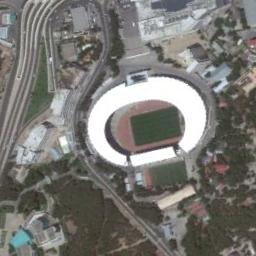

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/ship/ship_400.jpg


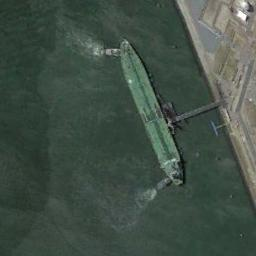

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/river/river_695.jpg


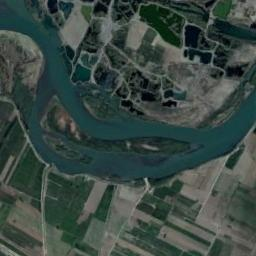

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/freeway/freeway_104.jpg


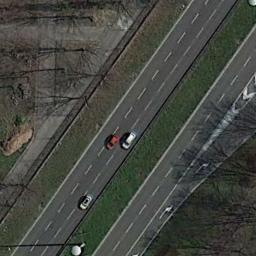

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/ship/ship_157.jpg


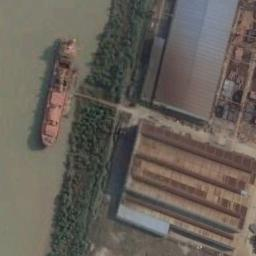

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/freeway/freeway_270.jpg


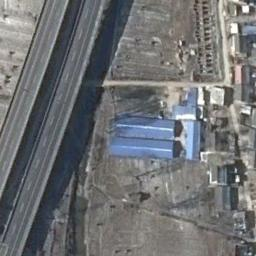

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/ship/ship_292.jpg


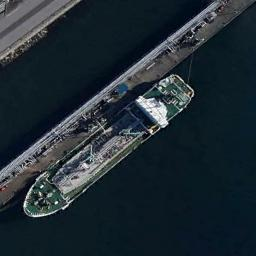

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/ship/ship_403.jpg


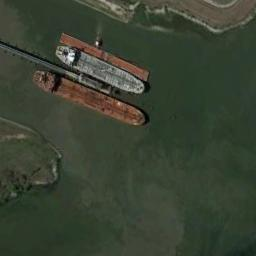

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/freeway/freeway_245.jpg


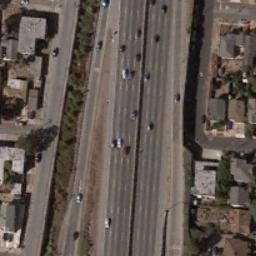

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/stadium/stadium_183.jpg


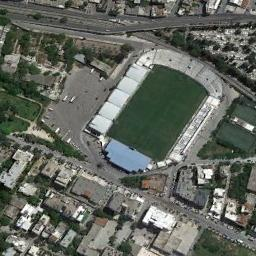

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/stadium/stadium_279.jpg


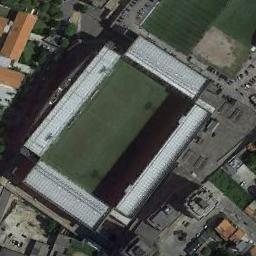

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/palace/palace_653.jpg


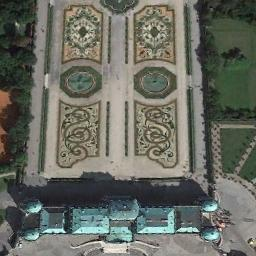

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/stadium/stadium_549.jpg


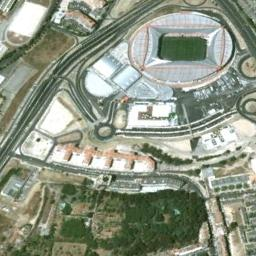

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/stadium/stadium_315.jpg


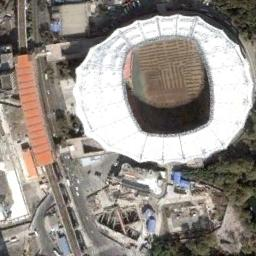

In [56]:
database = get_db(full_database,imgs_per_classes=1)
query_db = database[database['view']=='str']
for i in range(query_db.shape[0]):
    print('\n\n\nQuery Image: Street View of ', query_db['class'].iloc[i])
    query_im_path = query_db['img_path'].iloc[i]
    display(Image(filename=query_im_path, width=256, height=256))
    query_fv_path = query_db['fv_path'].iloc[i]
    top_match_dict = search(query_fv_path, full_database, dist_metric='cosine', num_results=20)
    print('\nTop Matching Satellite Images:')
    for match_fv_path in list(top_match_dict.keys()):
        match_im_path = full_database[full_database['fv_path']==match_fv_path]['img_path'].values[0]
        print(match_im_path)
        display(Image(filename=match_im_path, width=256, height=256))

##### Using the DML




Query Image: Street View of  mountain


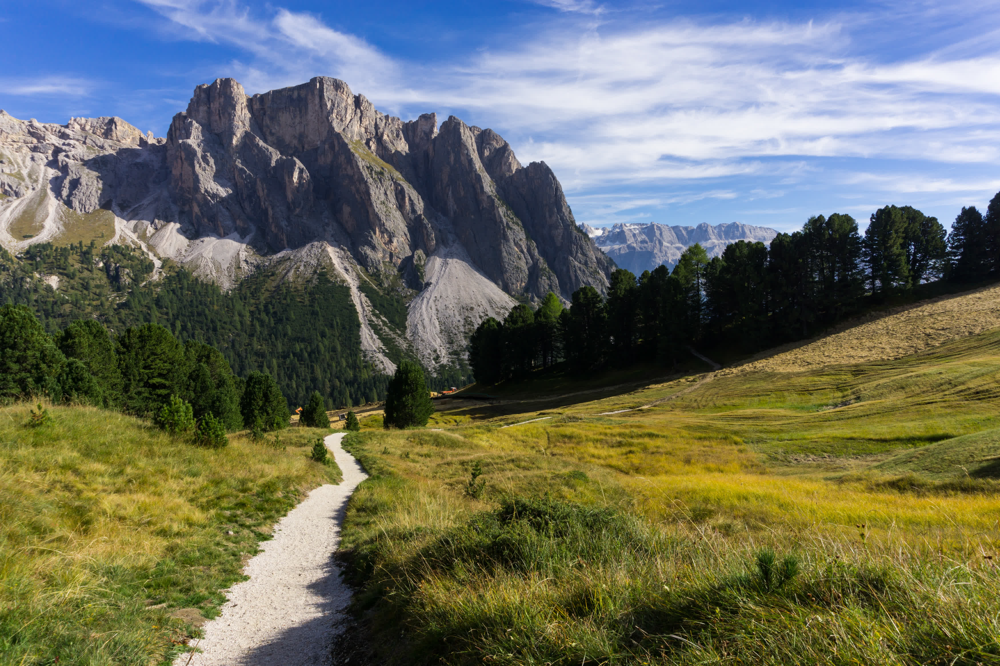


Top Matching Satellite Images:
/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/river/river_586.jpg


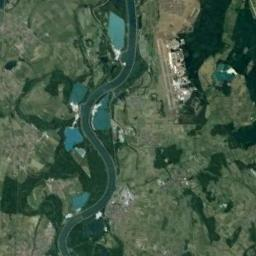

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/mountain/mountain_479.jpg


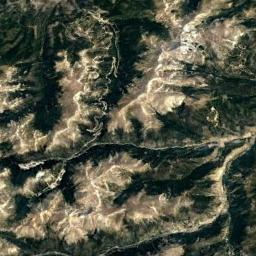

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/river/river_031.jpg


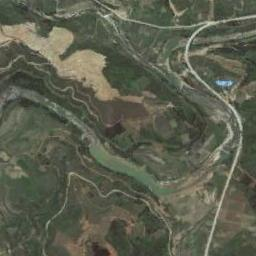

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/palace/palace_241.jpg


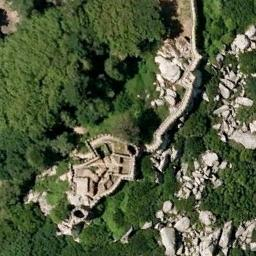

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/river/river_660.jpg


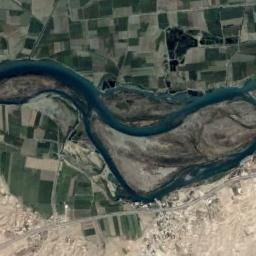

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/river/river_284.jpg


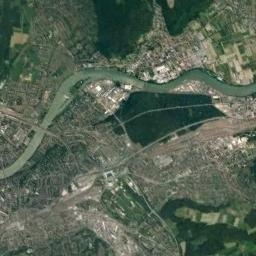

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/river/river_588.jpg


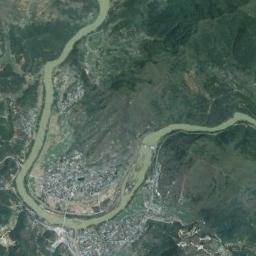

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/mountain/mountain_074.jpg


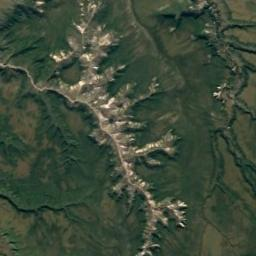

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/mountain/mountain_046.jpg


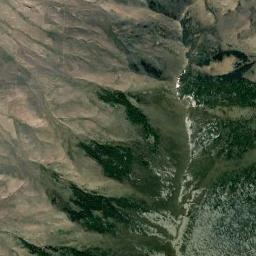

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/mountain/mountain_696.jpg


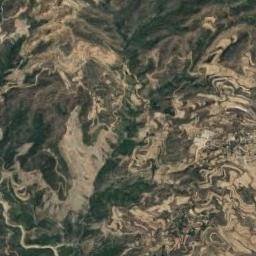

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/mountain/mountain_102.jpg


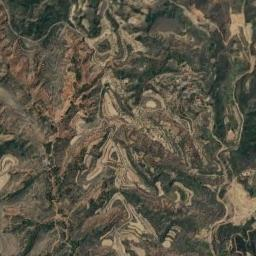

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/mountain/mountain_631.jpg


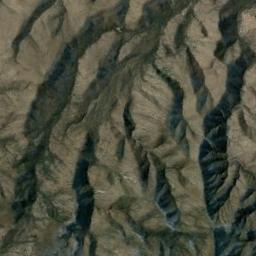

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/mountain/mountain_273.jpg


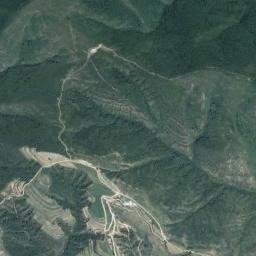

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/freeway/freeway_060.jpg


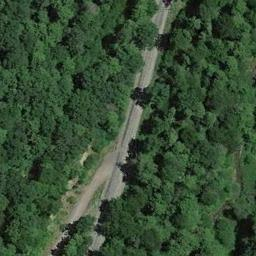

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/mountain/mountain_626.jpg


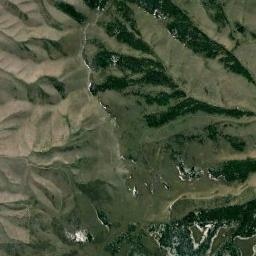

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/river/river_236.jpg


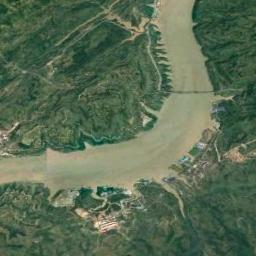

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/mountain/mountain_345.jpg


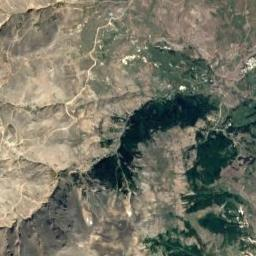

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/mountain/mountain_262.jpg


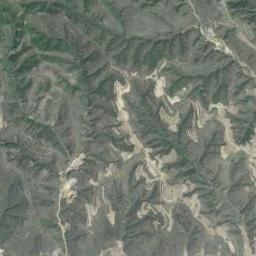

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/river/river_134.jpg


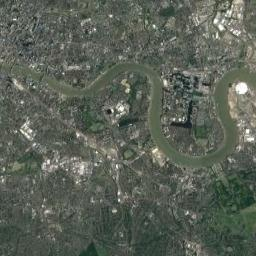

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/mountain/mountain_510.jpg


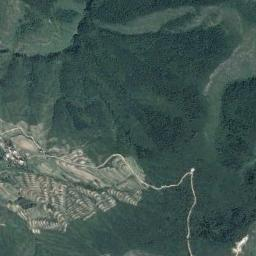




Query Image: Street View of  river


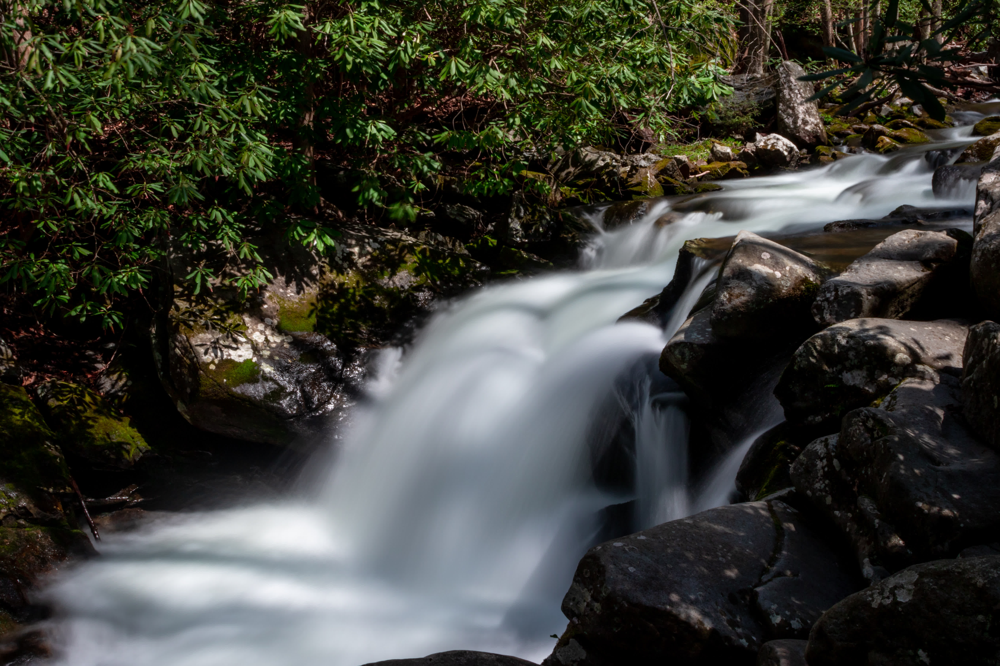


Top Matching Satellite Images:
/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/river/river_347.jpg


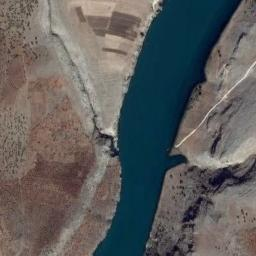

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/river/river_655.jpg


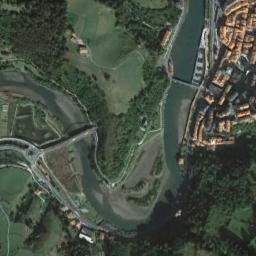

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/river/river_212.jpg


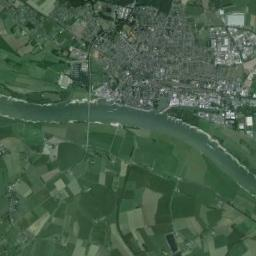

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/river/river_232.jpg


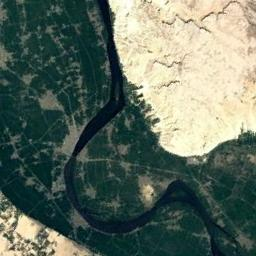

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/river/river_117.jpg


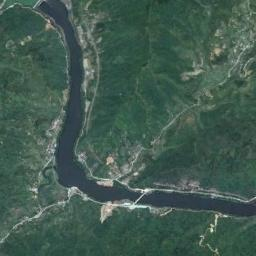

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/river/river_284.jpg


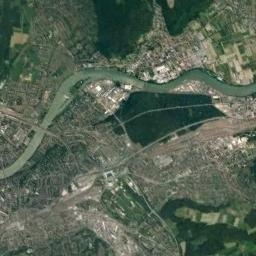

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/river/river_585.jpg


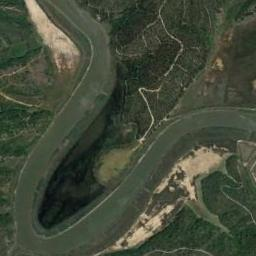

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/river/river_101.jpg


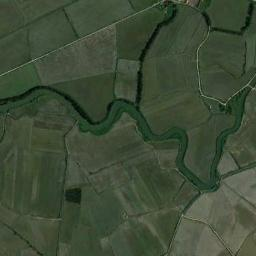

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/river/river_307.jpg


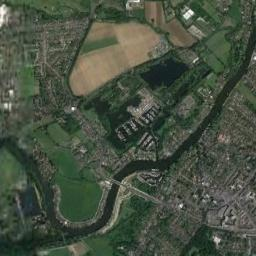

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/river/river_660.jpg


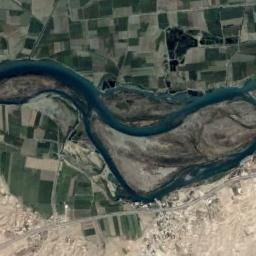

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/river/river_425.jpg


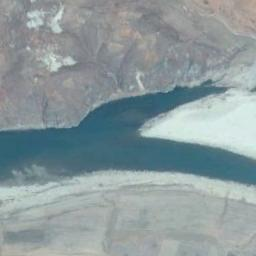

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/river/river_424.jpg


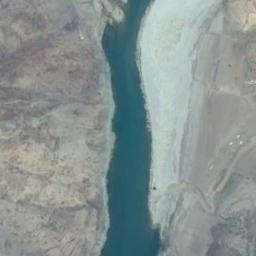

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/river/river_221.jpg


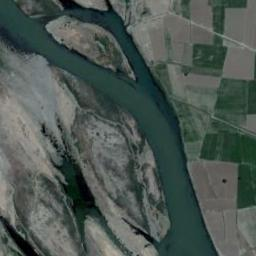

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/river/river_350.jpg


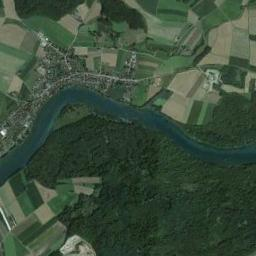

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/river/river_236.jpg


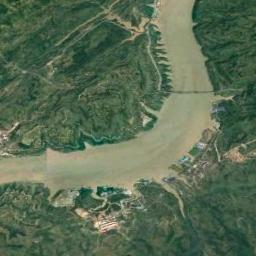

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/river/river_256.jpg


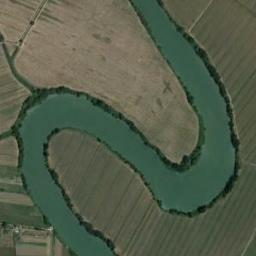

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/mountain/mountain_074.jpg


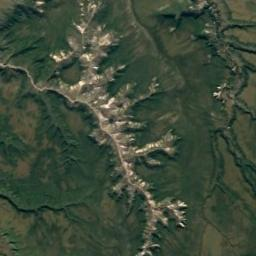

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/mountain/mountain_240.jpg


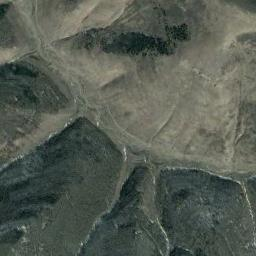

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/river/river_470.jpg


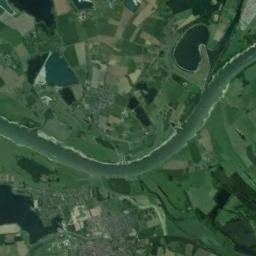

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/river/river_607.jpg


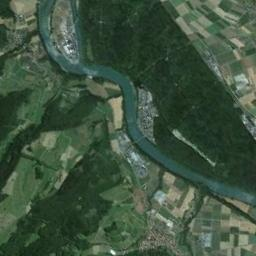




Query Image: Street View of  freeway


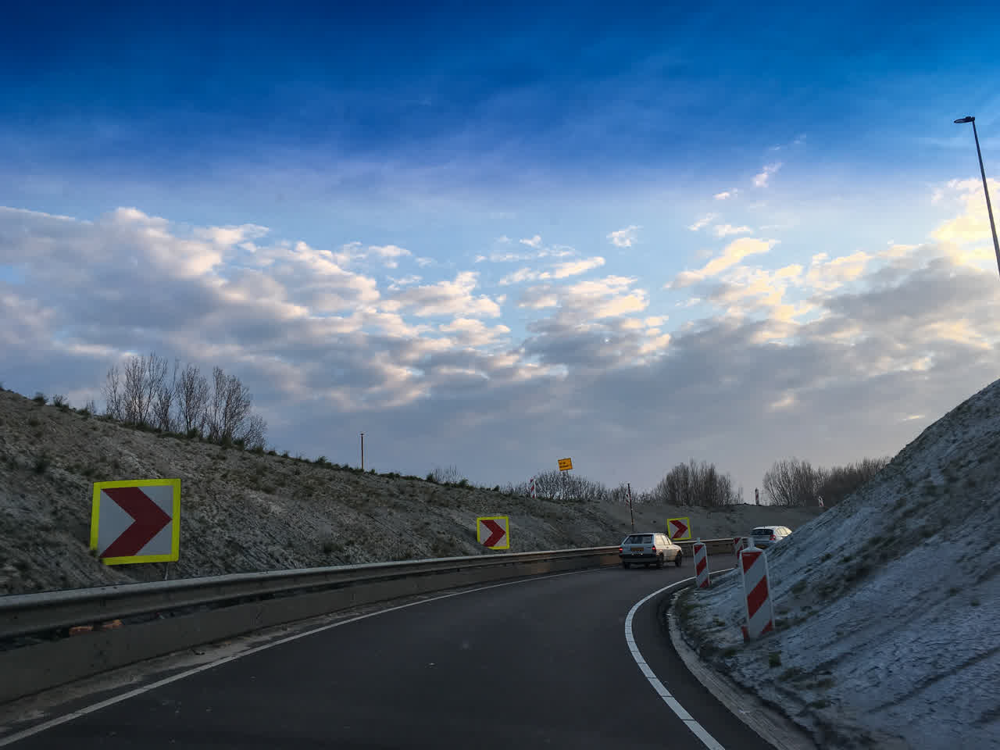


Top Matching Satellite Images:
/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/freeway/freeway_465.jpg


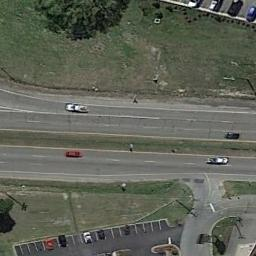

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/freeway/freeway_583.jpg


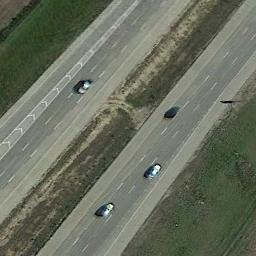

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/freeway/freeway_111.jpg


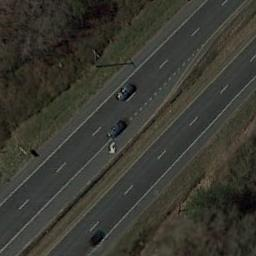

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/freeway/freeway_314.jpg


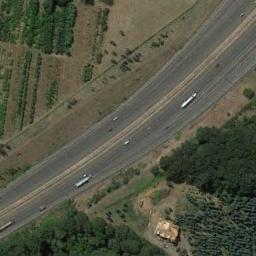

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/freeway/freeway_413.jpg


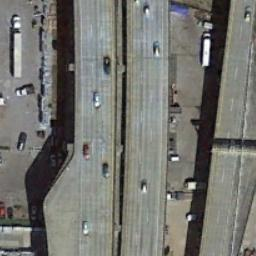

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/freeway/freeway_454.jpg


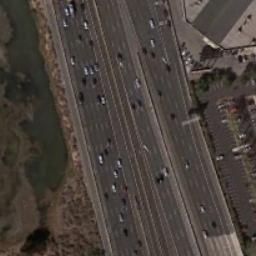

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/freeway/freeway_245.jpg


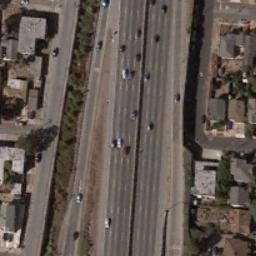

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/freeway/freeway_482.jpg


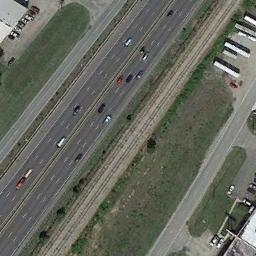

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/freeway/freeway_169.jpg


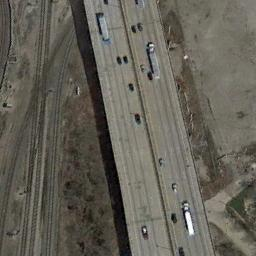

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/freeway/freeway_380.jpg


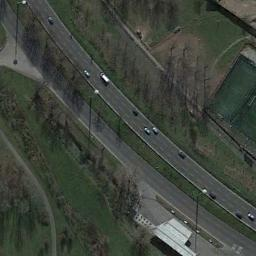

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/freeway/freeway_357.jpg


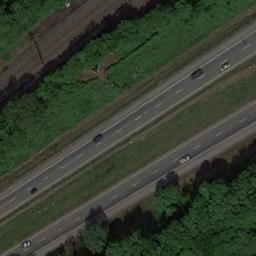

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/freeway/freeway_307.jpg


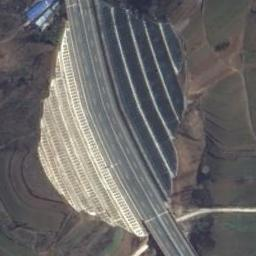

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/freeway/freeway_394.jpg


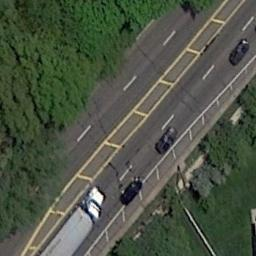

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/freeway/freeway_194.jpg


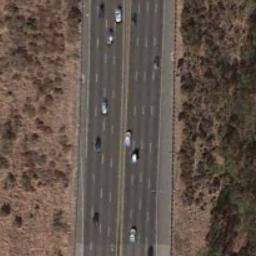

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/freeway/freeway_665.jpg


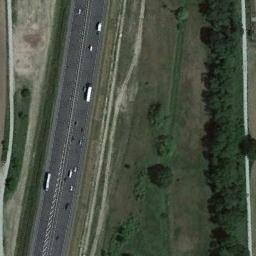

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/freeway/freeway_208.jpg


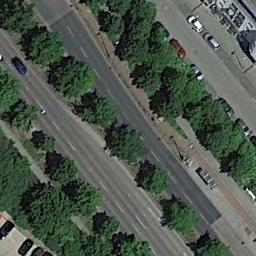

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/freeway/freeway_585.jpg


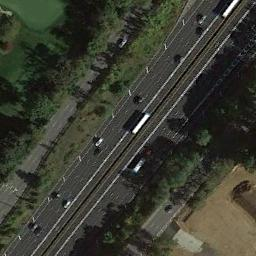

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/freeway/freeway_080.jpg


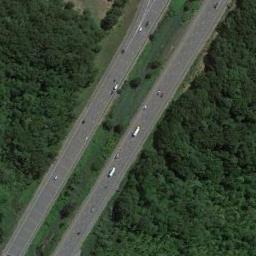

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/freeway/freeway_147.jpg


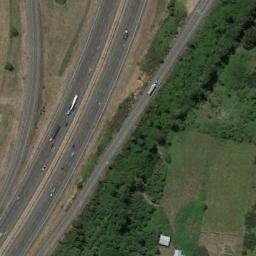

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/freeway/freeway_226.jpg


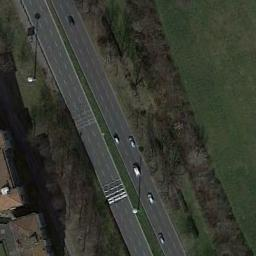




Query Image: Street View of  stadium


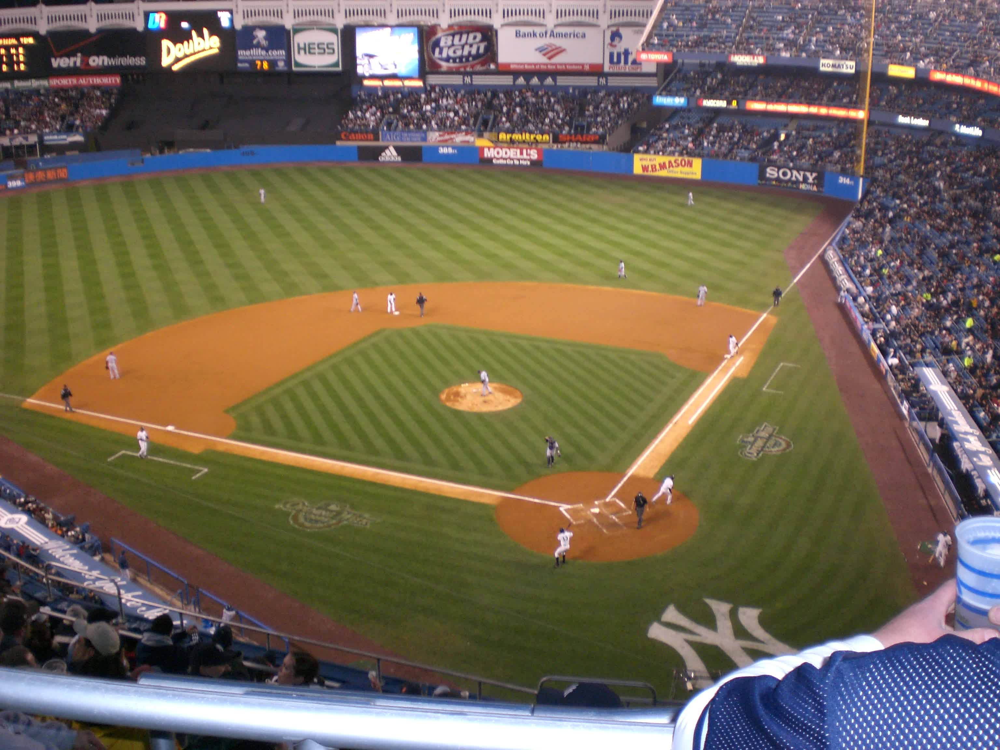


Top Matching Satellite Images:
/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/stadium/stadium_348.jpg


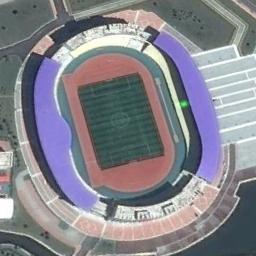

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/stadium/stadium_652.jpg


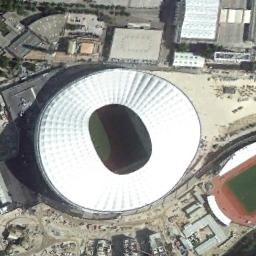

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/stadium/stadium_256.jpg


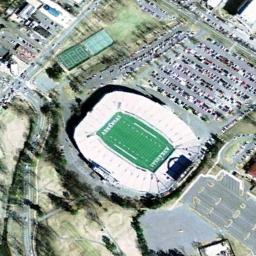

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/stadium/stadium_110.jpg


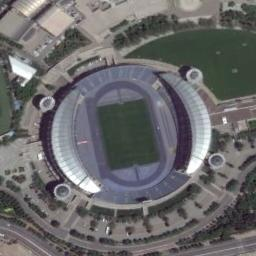

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/stadium/stadium_463.jpg


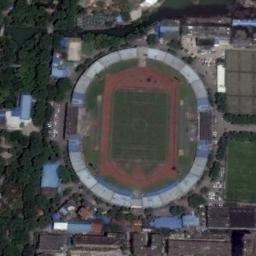

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/stadium/stadium_057.jpg


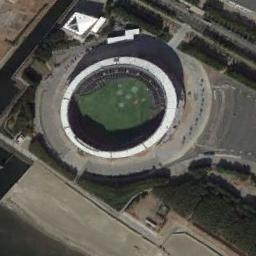

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/stadium/stadium_328.jpg


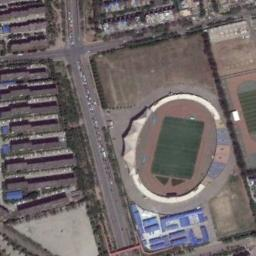

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/stadium/stadium_374.jpg


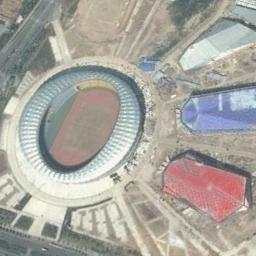

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/stadium/stadium_450.jpg


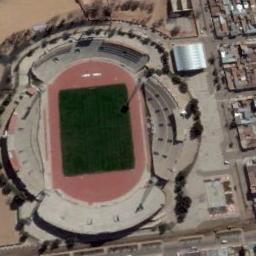

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/stadium/stadium_646.jpg


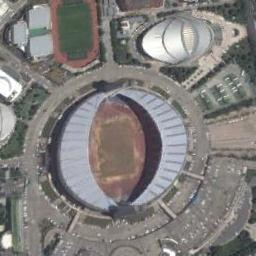

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/stadium/stadium_345.jpg


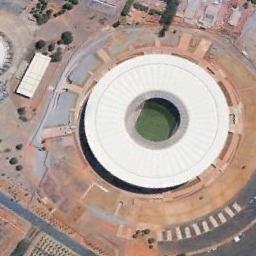

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/stadium/stadium_589.jpg


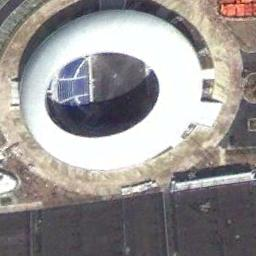

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/stadium/stadium_354.jpg


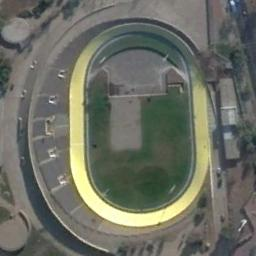

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/stadium/stadium_017.jpg


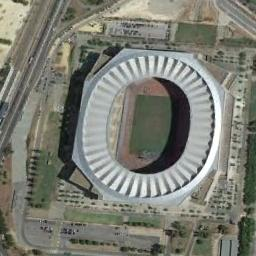

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/stadium/stadium_693.jpg


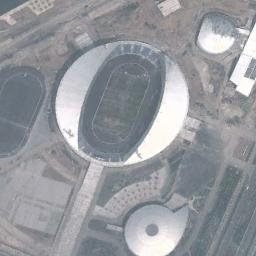

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/stadium/stadium_488.jpg


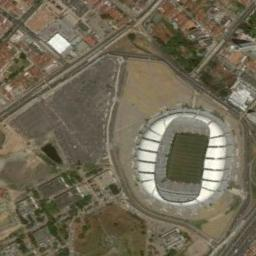

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/stadium/stadium_644.jpg


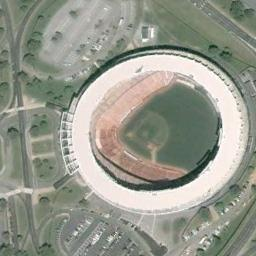

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/stadium/stadium_455.jpg


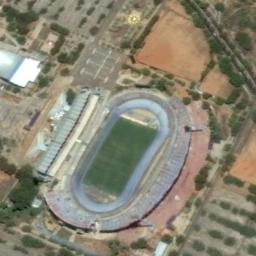

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/stadium/stadium_429.jpg


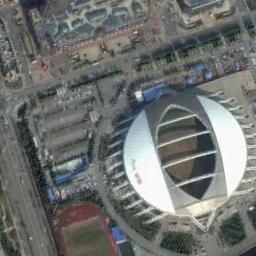

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/stadium/stadium_631.jpg


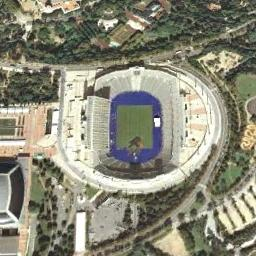




Query Image: Street View of  ship


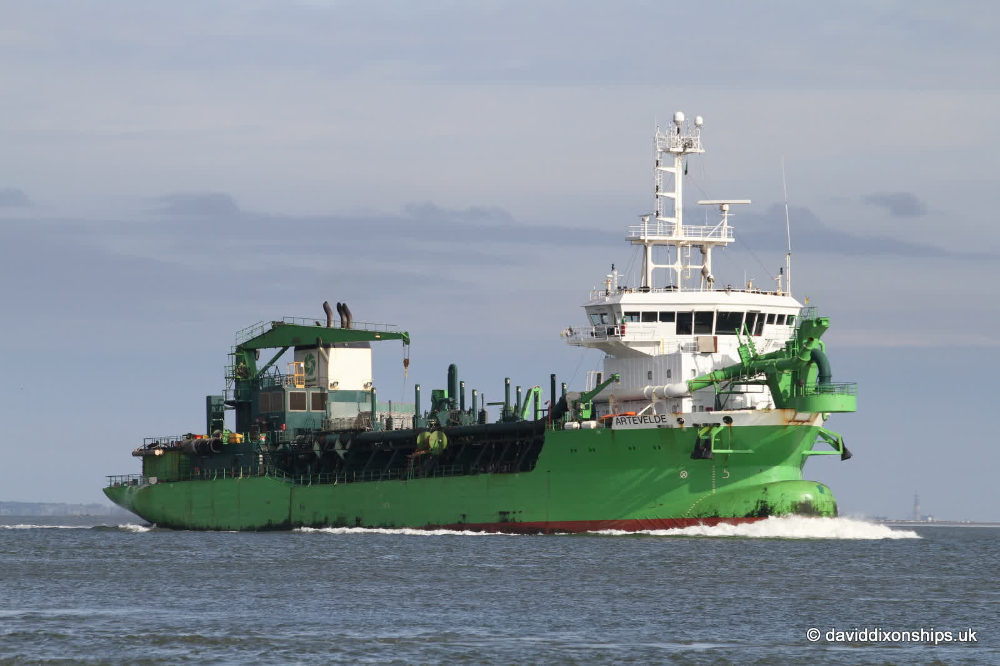


Top Matching Satellite Images:
/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/ship/ship_425.jpg


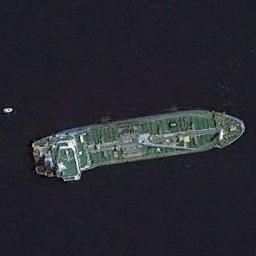

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/ship/ship_668.jpg


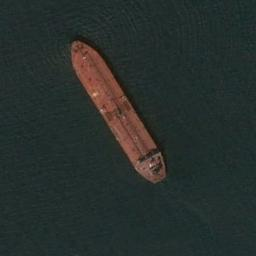

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/ship/ship_294.jpg


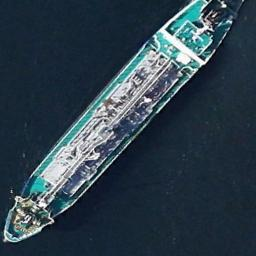

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/ship/ship_405.jpg


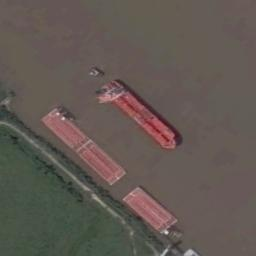

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/ship/ship_202.jpg


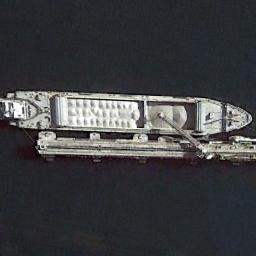

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/ship/ship_209.jpg


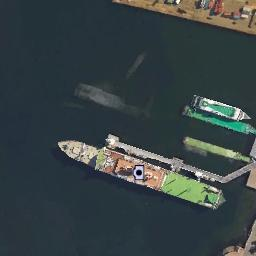

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/ship/ship_471.jpg


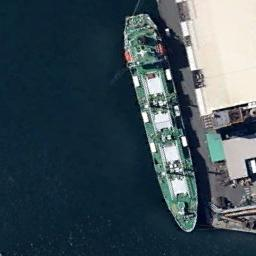

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/ship/ship_502.jpg


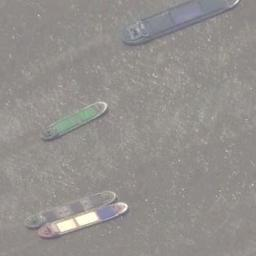

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/ship/ship_370.jpg


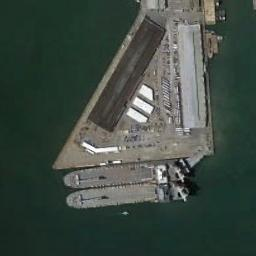

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/ship/ship_604.jpg


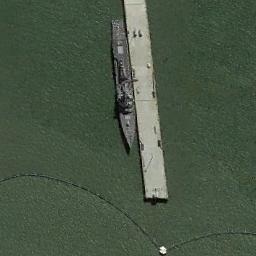

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/ship/ship_292.jpg


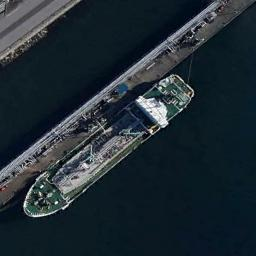

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/ship/ship_347.jpg


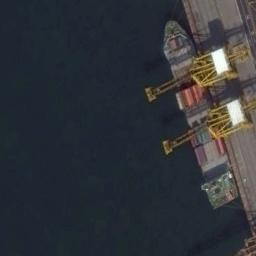

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/ship/ship_224.jpg


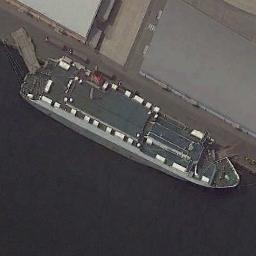

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/ship/ship_643.jpg


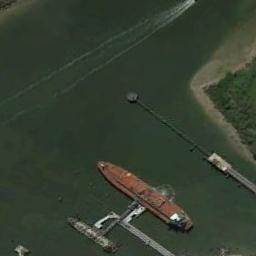

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/ship/ship_163.jpg


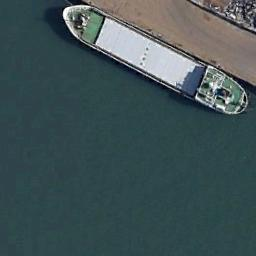

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/palace/palace_686.jpg


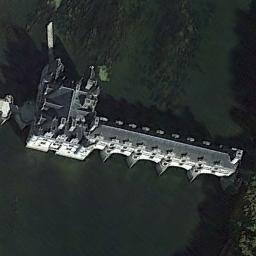

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/ship/ship_628.jpg


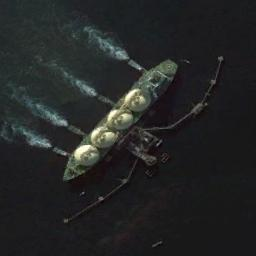

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/ship/ship_082.jpg


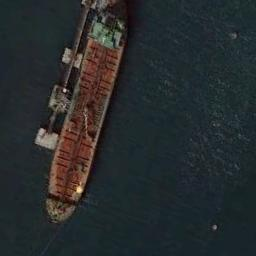

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/ship/ship_250.jpg


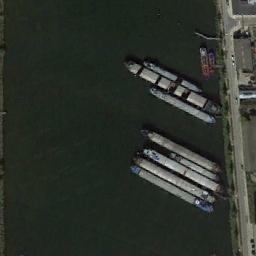

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/ship/ship_282.jpg


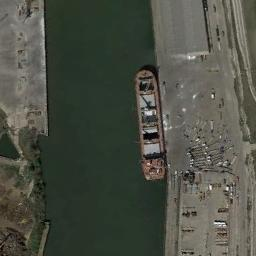




Query Image: Street View of  palace


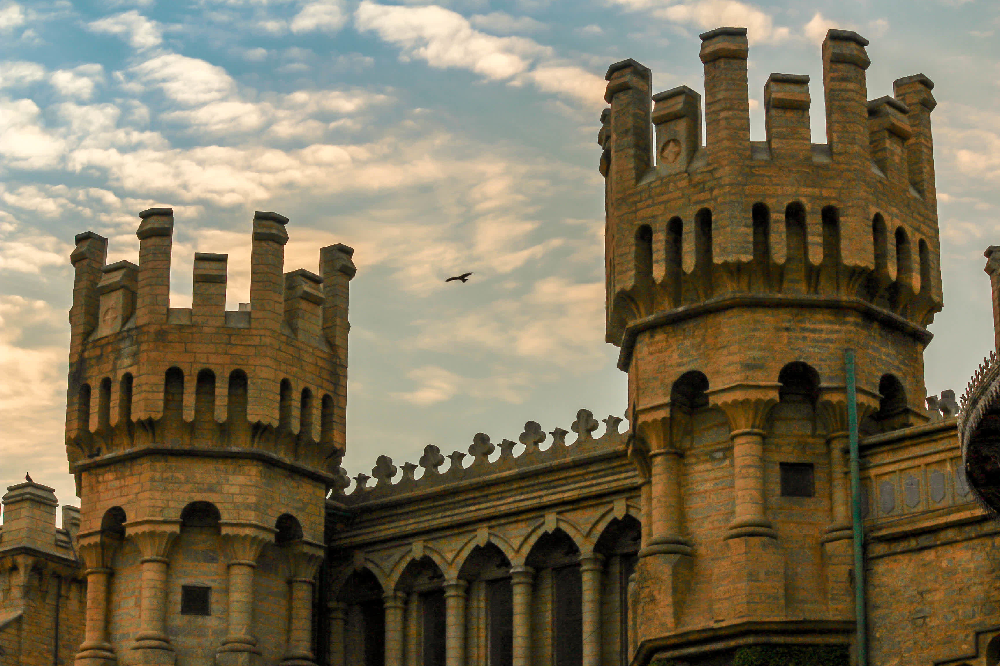


Top Matching Satellite Images:
/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/palace/palace_455.jpg


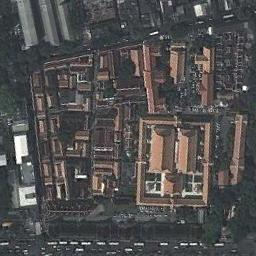

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/palace/palace_664.jpg


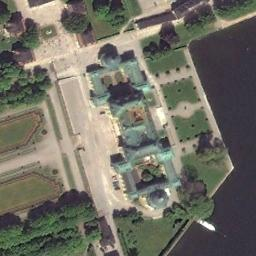

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/palace/palace_358.jpg


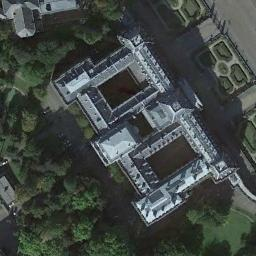

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/palace/palace_104.jpg


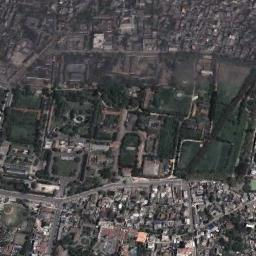

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/palace/palace_057.jpg


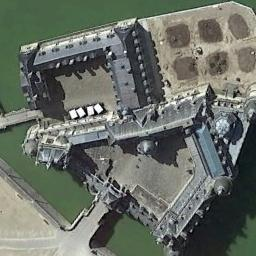

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/palace/palace_264.jpg


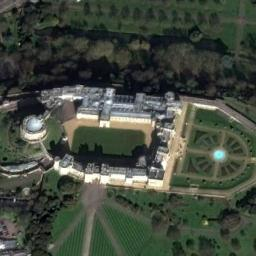

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/palace/palace_659.jpg


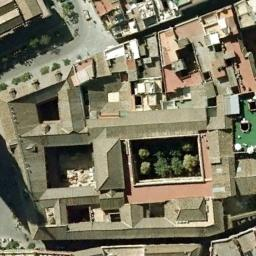

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/palace/palace_700.jpg


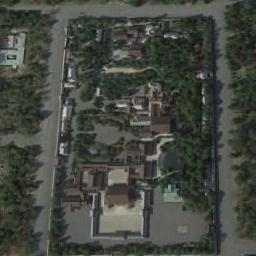

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/palace/palace_343.jpg


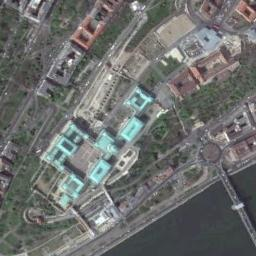

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/palace/palace_537.jpg


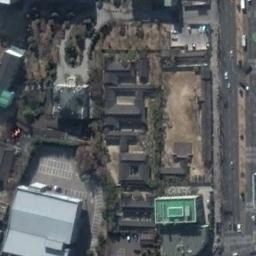

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/palace/palace_316.jpg


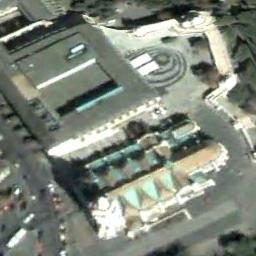

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/palace/palace_280.jpg


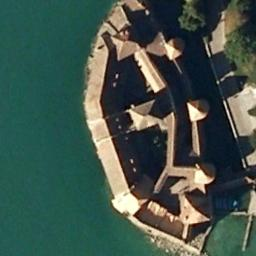

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/palace/palace_070.jpg


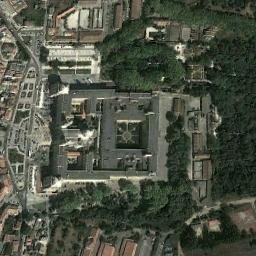

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/palace/palace_641.jpg


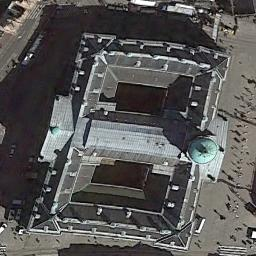

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/palace/palace_217.jpg


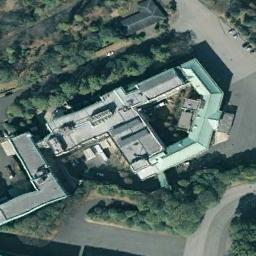

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/palace/palace_286.jpg


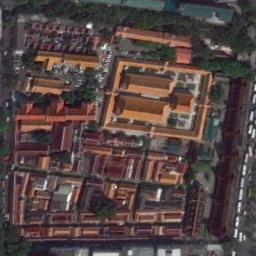

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/palace/palace_276.jpg


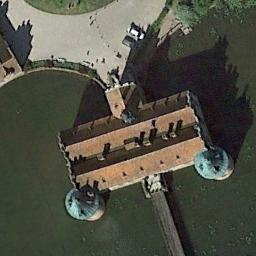

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/palace/palace_686.jpg


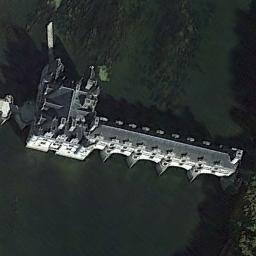

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/palace/palace_550.jpg


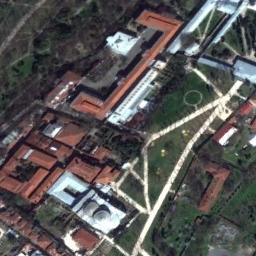

/content/drive/My Drive/Colab Notebooks/DL_HW4/SatView/Images/palace/palace_016.jpg


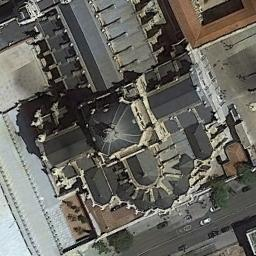

In [57]:
database = get_db(full_database,imgs_per_classes=1)
query_db = database[database['view']=='str']
for i in range(query_db.shape[0]):
    print('\n\n\nQuery Image: Street View of ', query_db['class'].iloc[i])
    query_im_path = query_db['img_path'].iloc[i]
    display(Image(filename=query_im_path, width=256, height=256))
    query_fv_path = query_db['fv_path'].iloc[i]
    top_match_dict = search(query_fv_path, full_database, dist_metric='dml', num_results=20)
    print('\nTop Matching Satellite Images:')
    for match_fv_path in list(top_match_dict.keys()):
        match_im_path = full_database[full_database['fv_path']==match_fv_path]['img_path'].values[0]
        print(match_im_path)
        display(Image(filename=match_im_path, width=256, height=256))

#### Analysis

**Visualizations are shown above**, with street view images displayed, whose same class satellite view images have to be retrieved. *Top 20* satellite view images results, along with their classes are also displayed.

Overall insights:
*   Cosine similarity does really bad with cross-view image retrieval. While there is some apparent aesthetic similarity in original image and retrieved image, images from wrong class are retrieved frequently.
*   DML retrieves cross-view images really well (as expected from a model with 91% validation accuracy) and significantly outperforms cosine similarity difference.
*   Even with DML, performance for **mountain** class is quite bad.
*   First performed manual testing on top 5 satellite view results for 1 street images from each class. All 5 images were correctly selected for all classes except mountain.
*   Then performed manual testing on top 20 satellite view results for 1 street image from each class:
  1.   Mountain: 11/20 (correct cross-view images retrieved). 7 times incorrectly classified as river. As said in analysis of confusion matrix results in classification task, mountains (with rivers) are a pain point.
  2.   River: 18/20 correct. 2 mountains incorrectly classified river.
  3.   Freeway: 20/20 correct.
  4.   Stadium: 20/20 correct.
  5.   Ship: 19/20 correct. The 1 incorrect image was a palace with shape quite similar to a ship.
  6.   Palace: 20/20 correct.
* DML's accuracy of ~91% is likely to be because of mountain(-river) confusion, and it isn't expected to be made noticeably higher as long as mountain class is there. 




